In [ ]:
!pip install opendatasets --upgrade --quiet
import opendatasets as od

dataset_url = 'https://www.kaggle.com/kvpratama/pokemon-images-dataset'
od.download(dataset_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: tolgaik
Your Kaggle Key: ··········


  7%|▋         | 5.00M/70.9M [00:00<00:02, 31.2MB/s]

100%|██████████| 70.9M/70.9M [00:00<00:00, 93.0MB/s]


In [ ]:
import os 
data_dir = 'pokemon-images-dataset/pokemon_jpg'
print(os.listdir(data_dir))

['pokemon_jpg']


In [ ]:
print(os.listdir(data_dir + '/pokemon_jpg')[:5])

['139.jpg', '632.jpg', '24.jpg', '324.jpg', '633.jpg']


In [ ]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [ ]:
#image_size = 256
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [ ]:
transform = T.Compose([T.ToTensor(),
                       T.CenterCrop(256),
                       T.Resize(image_size),
                       T.Normalize(*stats),
                       T.RandomHorizontalFlip()])

train_ds = ImageFolder(data_dir , transform = transform) 

In [ ]:
train_dl = DataLoader(train_ds, batch_size = batch_size, shuffle = True, num_workers = 4, pin_memory = True)

In [ ]:
train_dl

In [ ]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [ ]:
def show_images(images, nmax = 64):
  fig, ax = plt.subplots(figsize=(8,8))
  ax.set_xticks([]); ax.set_yticks([])
  ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow = 8).permute(1, 2, 0))

def show_batch(dl, nmax = 64):
  for images, _ in dl:
    show_images(images)
    break

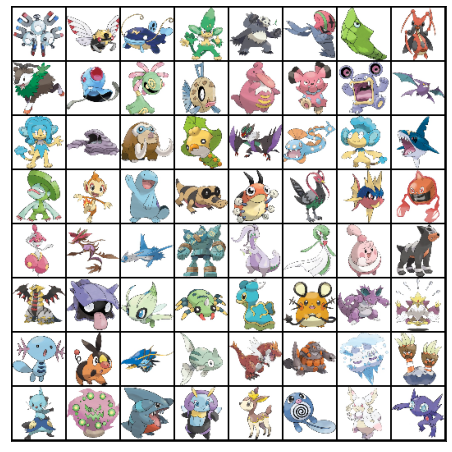

In [ ]:
show_batch(train_dl)

In [ ]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda:0')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [ ]:
device = get_default_device()

In [ ]:
device

device(type='cuda', index=0)

In [ ]:
train_dl = DeviceDataLoader(train_dl, device)

In [ ]:
import torch.nn as nn
import torch.nn.functional as F

In [ ]:
train_ds[0][0].shape

torch.Size([3, 64, 64])

In [ ]:
'''discriminator = nn.Sequential(
    #input: 3 x 256 x 256

    nn.Conv2d(3, 64, kernel_size = 4, stride = 2, padding = 1, bias = True),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace = True),
    #out: 64 x 128 x 128

    nn.Conv2d(64, 128, kernel_size = 4, stride = 2, padding = 1, bias = False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace = True),
    #out: 128 x 64 x 64

    nn.Conv2d(128, 256, kernel_size = 4, stride = 2, padding = 1, bias = False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace = True),
    #out: 256 x 32 x 32

    nn.Conv2d(256, 512, kernel_size = 4, stride = 2, padding = 1, bias = False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 16 x 16

    nn.Conv2d(512, 1024, kernel_size = 4, stride = 2, padding = 1, bias = False),
    nn.BatchNorm2d(1024),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 1024 x 8 x 8

    nn.Conv2d(1024, 1024, kernel_size = 4, stride = 2, padding = 1, bias = False),
    nn.BatchNorm2d(1024),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 1024 x 4 x 4

    nn.Conv2d(1024, 1, kernel_size = 4, stride = 1, padding = 0, bias = True),
    
    nn.Flatten(),
    nn.Sigmoid()
)'''

'discriminator = nn.Sequential(\n    #input: 3 x 256 x 256\n\n    nn.Conv2d(3, 64, kernel_size = 4, stride = 2, padding = 1, bias = True),\n    nn.BatchNorm2d(64),\n    nn.LeakyReLU(0.2, inplace = True),\n    #out: 64 x 128 x 128\n\n    nn.Conv2d(64, 128, kernel_size = 4, stride = 2, padding = 1, bias = False),\n    nn.BatchNorm2d(128),\n    nn.LeakyReLU(0.2, inplace = True),\n    #out: 128 x 64 x 64\n\n    nn.Conv2d(128, 256, kernel_size = 4, stride = 2, padding = 1, bias = False),\n    nn.BatchNorm2d(256),\n    nn.LeakyReLU(0.2, inplace = True),\n    #out: 256 x 32 x 32\n\n    nn.Conv2d(256, 512, kernel_size = 4, stride = 2, padding = 1, bias = False),\n    nn.BatchNorm2d(512),\n    nn.LeakyReLU(0.2, inplace=True),\n    # out: 512 x 16 x 16\n\n    nn.Conv2d(512, 1024, kernel_size = 4, stride = 2, padding = 1, bias = False),\n    nn.BatchNorm2d(1024),\n    nn.LeakyReLU(0.2, inplace=True),\n    # out: 1024 x 8 x 8\n\n    nn.Conv2d(1024, 1024, kernel_size = 4, stride = 2, padding = 1, b

In [ ]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [ ]:
discriminator = to_device(discriminator, device)

In [ ]:
latent_size = 256

In [ ]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

In [ ]:
'''generator = nn.Sequential(
     # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 1024, kernel_size = 4, stride = 1, padding = 0, bias = True),
    nn.BatchNorm2d(1024),
    nn.ReLU(),
    #out: 1024 x 4 x 4

    nn.ConvTranspose2d(1024, 1024, kernel_size = 4, stride = 2, padding = 1, bias = True),
    nn.BatchNorm2d(1024),
    nn.ReLU(),
    #out: 1024 x 8 x 8

    nn.ConvTranspose2d(1024, 512, kernel_size = 4, stride = 2, padding = 1, bias = True),
    nn.BatchNorm2d(512),
    nn.ReLU(),
    #out: 512 x 16 x 16

    nn.ConvTranspose2d(512, 256, kernel_size = 4, stride = 2, padding = 1, bias = True),
    nn.BatchNorm2d(256),
    nn.ReLU(),
    #out: 256 x 32 x 32 

    nn.ConvTranspose2d(256, 128, kernel_size = 4, stride = 2, padding = 1, bias = True),
    nn.BatchNorm2d(128),
    nn.ReLU(),
    #out: 128 x 64 x 64 

    nn.ConvTranspose2d(128, 64, kernel_size = 4, stride = 2, padding = 1, bias = True),
    nn.BatchNorm2d(64),
    nn.ReLU(),
    #out: 64 x 128 x 128

    nn.ConvTranspose2d(64, 3, kernel_size = 4, stride = 2, padding = 1, bias = True),
    nn.Tanh()
    #out: 3 x 256 x 256
)'''

'generator = nn.Sequential(\n     # in: latent_size x 1 x 1\n\n    nn.ConvTranspose2d(latent_size, 1024, kernel_size = 4, stride = 1, padding = 0, bias = True),\n    nn.BatchNorm2d(1024),\n    nn.ReLU(),\n    #out: 1024 x 4 x 4\n\n    nn.ConvTranspose2d(1024, 1024, kernel_size = 4, stride = 2, padding = 1, bias = True),\n    nn.BatchNorm2d(1024),\n    nn.ReLU(),\n    #out: 1024 x 8 x 8\n\n    nn.ConvTranspose2d(1024, 512, kernel_size = 4, stride = 2, padding = 1, bias = True),\n    nn.BatchNorm2d(512),\n    nn.ReLU(),\n    #out: 512 x 16 x 16\n\n    nn.ConvTranspose2d(512, 256, kernel_size = 4, stride = 2, padding = 1, bias = True),\n    nn.BatchNorm2d(256),\n    nn.ReLU(),\n    #out: 256 x 32 x 32 \n\n    nn.ConvTranspose2d(256, 128, kernel_size = 4, stride = 2, padding = 1, bias = True),\n    nn.BatchNorm2d(128),\n    nn.ReLU(),\n    #out: 128 x 64 x 64 \n\n    nn.ConvTranspose2d(128, 64, kernel_size = 4, stride = 2, padding = 1, bias = True),\n    nn.BatchNorm2d(64),\n    nn.ReLU(),

In [ ]:
generator = to_device(generator, device)

In [ ]:
torch.cuda.empty_cache()

torch.Size([128, 3, 64, 64])


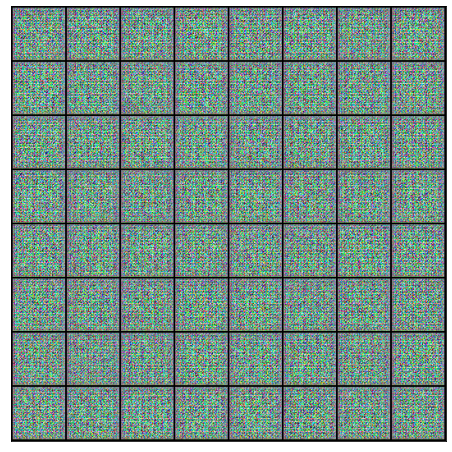

In [ ]:
xb = torch.randn(batch_size, latent_size, 1, 1, device = device)
fake_image = generator(xb)
print(fake_image.shape)
show_images(fake_image.cpu())

In [ ]:
def train_generator(opt_T):
  opt_T.zero_grad()

  # Generate fake images
  latent = torch.randn(batch_size, latent_size, 1, 1, device = device)
  fake_image = generator(latent)

  # Try to fool the discriminator (fake resimler 0 olcağından ve biz kandırmak için targetlara 1 vericez)
  preds = discriminator(fake_image)
  targets = torch.ones(batch_size, 1 , device = device)
  loss = F.binary_cross_entropy(preds, targets)

  # Update generator weights
  loss.backward()
  opt_T.step()

  return loss.item()

In [ ]:
def train_discriminator(real_images, opt_D):
  opt_D.zero_grad()

  # Gerçek görüntüleri discriminatordan geçirin
  real_preds = discriminator(real_images)
  real_targets = torch.ones(real_images.size(0), 1, device = device)
  real_loss = F.binary_cross_entropy(real_preds, real_targets)
  real_score = torch.mean(real_preds).item()

  # Generate fake images
  latent = torch.randn(batch_size, latent_size, 1, 1, device = device)
  fake_images = generator(latent)

  #Sahte görüntüleri discriminatordan geçir
  fake_preds = discriminator(fake_images)
  fake_targets = torch.zeros(fake_images.size(0), 1, device = device)
  fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
  fake_score = torch.mean(fake_preds).item()

  # Update discriminator weights
  loss = fake_loss + real_loss
  loss.backward()
  opt_D.step()

  return loss.item(), real_score, fake_score

In [ ]:
from torchvision.utils import save_image
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-0000.png


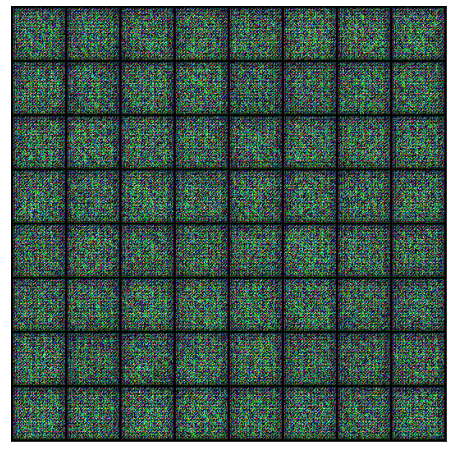

In [ ]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)
save_samples(0, fixed_latent)

In [ ]:
from tqdm.notebook import tqdm

In [ ]:
def fit(epochs, lr, start_idx = 1):
  torch.cuda.empty_cache()

  losses_g = []
  losses_d = []
  real_scores = []
  fake_scores = []

  opt_D = torch.optim.Adam(discriminator.parameters(), lr, betas=(0.5, 0.999))
  opt_G = torch.optim.Adam(generator.parameters(), lr, betas=(0.5, 0.999))
  
  for epoch in range(epochs):
    for real_images, _ in tqdm(train_dl):
      # Train discriminator
      loss_d, real_score, fake_score = train_discriminator(real_images, opt_D)
      # Train genarator
      loss_g = train_generator(opt_G)

    #Record losses & score
    losses_g.append(loss_g)
    losses_d.append(loss_d)
    real_scores.append(real_score)
    fake_scores.append(fake_score)

    # Log losses & scores (last batch)
    print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))
    
    save_samples(epoch + start_idx, fixed_latent, show = False)#fonksiyon genarator ile fake image üretir

  return losses_g, losses_d, real_scores, fake_scores 

In [ ]:
lr = 0.0002
epochs = 1000


Epoch [1/1000], loss_g: 13.2555, loss_d: 0.1750, real_score: 0.8615, fake_score: 0.0001
Saving generated-images-0001.png



Epoch [2/1000], loss_g: 13.7058, loss_d: 1.6320, real_score: 0.9800, fake_score: 0.7888
Saving generated-images-0002.png



Epoch [3/1000], loss_g: 14.7999, loss_d: 0.0719, real_score: 0.9447, fake_score: 0.0000
Saving generated-images-0003.png



Epoch [4/1000], loss_g: 14.9642, loss_d: 0.0698, real_score: 0.9393, fake_score: 0.0000
Saving generated-images-0004.png



Epoch [5/1000], loss_g: 16.7647, loss_d: 0.1730, real_score: 0.8708, fake_score: 0.0000
Saving generated-images-0005.png



Epoch [6/1000], loss_g: 17.4114, loss_d: 0.1512, real_score: 0.8715, fake_score: 0.0000
Saving generated-images-0006.png



Epoch [7/1000], loss_g: 11.9039, loss_d: 0.5158, real_score: 0.9878, fake_score: 0.3884
Saving generated-images-0007.png



Epoch [8/1000], loss_g: 10.8341, loss_d: 0.0097, real_score: 0.9910, fake_score: 0.0000
Saving generated-images-0008.png



Epoch [9/1000], loss_g: 9.2389, loss_d: 0.0352, real_score: 0.9673, fake_score: 0.0000
Saving generated-images-0009.png



Epoch [10/1000], loss_g: 7.4184, loss_d: 1.2594, real_score: 0.7792, fake_score: 0.5876
Saving generated-images-0010.png



Epoch [11/1000], loss_g: 5.2429, loss_d: 1.3638, real_score: 0.9064, fake_score: 0.6869
Saving generated-images-0011.png



Epoch [12/1000], loss_g: 4.4405, loss_d: 1.3851, real_score: 0.8362, fake_score: 0.6776
Saving generated-images-0012.png



Epoch [13/1000], loss_g: 2.1178, loss_d: 0.8156, real_score: 0.5817, fake_score: 0.1677
Saving generated-images-0013.png



Epoch [14/1000], loss_g: 2.6289, loss_d: 0.5826, real_score: 0.7239, fake_score: 0.2004
Saving generated-images-0014.png



Epoch [15/1000], loss_g: 2.7627, loss_d: 0.4659, real_score: 0.7986, fake_score: 0.2022
Saving generated-images-0015.png



Epoch [16/1000], loss_g: 4.3061, loss_d: 0.7421, real_score: 0.8401, fake_score: 0.4110
Saving generated-images-0016.png



Epoch [17/1000], loss_g: 3.0652, loss_d: 0.5885, real_score: 0.7668, fake_score: 0.2587
Saving generated-images-0017.png



Epoch [18/1000], loss_g: 0.9243, loss_d: 1.0152, real_score: 0.4370, fake_score: 0.0612
Saving generated-images-0018.png



Epoch [19/1000], loss_g: 3.9907, loss_d: 0.7052, real_score: 0.8418, fake_score: 0.3975
Saving generated-images-0019.png



Epoch [20/1000], loss_g: 4.0670, loss_d: 0.4949, real_score: 0.8818, fake_score: 0.2969
Saving generated-images-0020.png



Epoch [21/1000], loss_g: 2.5469, loss_d: 0.7164, real_score: 0.5834, fake_score: 0.0806
Saving generated-images-0021.png



Epoch [22/1000], loss_g: 3.3672, loss_d: 0.3578, real_score: 0.7868, fake_score: 0.0987
Saving generated-images-0022.png



Epoch [23/1000], loss_g: 3.1137, loss_d: 0.3850, real_score: 0.7558, fake_score: 0.0778
Saving generated-images-0023.png



Epoch [24/1000], loss_g: 3.1145, loss_d: 0.4100, real_score: 0.8350, fake_score: 0.1885
Saving generated-images-0024.png



Epoch [25/1000], loss_g: 4.0316, loss_d: 1.2738, real_score: 0.8490, fake_score: 0.6200
Saving generated-images-0025.png



Epoch [26/1000], loss_g: 2.2792, loss_d: 1.4111, real_score: 0.2867, fake_score: 0.0201
Saving generated-images-0026.png



Epoch [27/1000], loss_g: 2.5124, loss_d: 0.6349, real_score: 0.6995, fake_score: 0.2088
Saving generated-images-0027.png



Epoch [28/1000], loss_g: 1.6409, loss_d: 0.4864, real_score: 0.7968, fake_score: 0.2122
Saving generated-images-0028.png



Epoch [29/1000], loss_g: 2.6696, loss_d: 0.5574, real_score: 0.6621, fake_score: 0.1066
Saving generated-images-0029.png



Epoch [30/1000], loss_g: 3.5682, loss_d: 0.3947, real_score: 0.9012, fake_score: 0.2417
Saving generated-images-0030.png



Epoch [31/1000], loss_g: 2.8515, loss_d: 0.6716, real_score: 0.7228, fake_score: 0.2671
Saving generated-images-0031.png



Epoch [32/1000], loss_g: 3.2677, loss_d: 0.6652, real_score: 0.7919, fake_score: 0.3261
Saving generated-images-0032.png



Epoch [33/1000], loss_g: 3.8048, loss_d: 0.3154, real_score: 0.8233, fake_score: 0.1013
Saving generated-images-0033.png



Epoch [34/1000], loss_g: 3.5385, loss_d: 0.7542, real_score: 0.8345, fake_score: 0.4031
Saving generated-images-0034.png



Epoch [35/1000], loss_g: 2.1452, loss_d: 0.9113, real_score: 0.4667, fake_score: 0.0458
Saving generated-images-0035.png



Epoch [36/1000], loss_g: 2.5676, loss_d: 1.3069, real_score: 0.3117, fake_score: 0.0196
Saving generated-images-0036.png



Epoch [37/1000], loss_g: 2.3935, loss_d: 0.6985, real_score: 0.5671, fake_score: 0.0754
Saving generated-images-0037.png



Epoch [38/1000], loss_g: 0.8914, loss_d: 1.4453, real_score: 0.2821, fake_score: 0.0309
Saving generated-images-0038.png



Epoch [39/1000], loss_g: 3.5525, loss_d: 0.4852, real_score: 0.8893, fake_score: 0.2983
Saving generated-images-0039.png



Epoch [40/1000], loss_g: 5.2379, loss_d: 1.7755, real_score: 0.9677, fake_score: 0.7921
Saving generated-images-0040.png



Epoch [41/1000], loss_g: 1.3754, loss_d: 0.8459, real_score: 0.5187, fake_score: 0.1256
Saving generated-images-0041.png



Epoch [42/1000], loss_g: 2.4143, loss_d: 0.4911, real_score: 0.7087, fake_score: 0.1080
Saving generated-images-0042.png



Epoch [43/1000], loss_g: 1.0558, loss_d: 0.6389, real_score: 0.5921, fake_score: 0.0789
Saving generated-images-0043.png



Epoch [44/1000], loss_g: 3.4464, loss_d: 0.6620, real_score: 0.9221, fake_score: 0.4091
Saving generated-images-0044.png



Epoch [45/1000], loss_g: 3.4773, loss_d: 0.5597, real_score: 0.8425, fake_score: 0.3075
Saving generated-images-0045.png



Epoch [46/1000], loss_g: 2.2381, loss_d: 0.5195, real_score: 0.6639, fake_score: 0.0731
Saving generated-images-0046.png



Epoch [47/1000], loss_g: 1.6291, loss_d: 0.5172, real_score: 0.7160, fake_score: 0.1503
Saving generated-images-0047.png



Epoch [48/1000], loss_g: 2.5618, loss_d: 0.6005, real_score: 0.6855, fake_score: 0.1617
Saving generated-images-0048.png



Epoch [49/1000], loss_g: 3.7728, loss_d: 0.5676, real_score: 0.9171, fake_score: 0.3654
Saving generated-images-0049.png



Epoch [50/1000], loss_g: 2.2910, loss_d: 0.4831, real_score: 0.7056, fake_score: 0.1060
Saving generated-images-0050.png



Epoch [51/1000], loss_g: 2.5707, loss_d: 0.4771, real_score: 0.6704, fake_score: 0.0533
Saving generated-images-0051.png



Epoch [52/1000], loss_g: 7.9789, loss_d: 1.2896, real_score: 0.9476, fake_score: 0.6932
Saving generated-images-0052.png



Epoch [53/1000], loss_g: 2.9952, loss_d: 0.4285, real_score: 0.7600, fake_score: 0.1242
Saving generated-images-0053.png



Epoch [54/1000], loss_g: 3.4355, loss_d: 0.3530, real_score: 0.8770, fake_score: 0.1885
Saving generated-images-0054.png



Epoch [55/1000], loss_g: 2.4701, loss_d: 0.7473, real_score: 0.5032, fake_score: 0.0158
Saving generated-images-0055.png



Epoch [56/1000], loss_g: 3.0658, loss_d: 1.0505, real_score: 0.3875, fake_score: 0.0110
Saving generated-images-0056.png



Epoch [57/1000], loss_g: 3.9837, loss_d: 0.5226, real_score: 0.8764, fake_score: 0.3109
Saving generated-images-0057.png



Epoch [58/1000], loss_g: 4.5581, loss_d: 0.5350, real_score: 0.8613, fake_score: 0.3055
Saving generated-images-0058.png



Epoch [59/1000], loss_g: 2.1504, loss_d: 0.5272, real_score: 0.7554, fake_score: 0.2009
Saving generated-images-0059.png



Epoch [60/1000], loss_g: 2.5989, loss_d: 0.5176, real_score: 0.6420, fake_score: 0.0393
Saving generated-images-0060.png



Epoch [61/1000], loss_g: 1.6748, loss_d: 0.5935, real_score: 0.5952, fake_score: 0.0342
Saving generated-images-0061.png



Epoch [62/1000], loss_g: 1.7727, loss_d: 0.5796, real_score: 0.6073, fake_score: 0.0514
Saving generated-images-0062.png



Epoch [63/1000], loss_g: 1.2574, loss_d: 0.6379, real_score: 0.5813, fake_score: 0.0527
Saving generated-images-0063.png



Epoch [64/1000], loss_g: 3.7994, loss_d: 0.3768, real_score: 0.8838, fake_score: 0.2054
Saving generated-images-0064.png



Epoch [65/1000], loss_g: 5.5246, loss_d: 0.7186, real_score: 0.8665, fake_score: 0.4140
Saving generated-images-0065.png



Epoch [66/1000], loss_g: 3.5412, loss_d: 0.4602, real_score: 0.8966, fake_score: 0.2780
Saving generated-images-0066.png



Epoch [67/1000], loss_g: 3.2957, loss_d: 0.3192, real_score: 0.8814, fake_score: 0.1662
Saving generated-images-0067.png



Epoch [68/1000], loss_g: 0.8777, loss_d: 0.6188, real_score: 0.5846, fake_score: 0.0351
Saving generated-images-0068.png



Epoch [69/1000], loss_g: 4.1445, loss_d: 0.6934, real_score: 0.9216, fake_score: 0.4045
Saving generated-images-0069.png



Epoch [70/1000], loss_g: 2.7818, loss_d: 0.6474, real_score: 0.5658, fake_score: 0.0220
Saving generated-images-0070.png



Epoch [71/1000], loss_g: 4.0569, loss_d: 0.2417, real_score: 0.8837, fake_score: 0.1067
Saving generated-images-0071.png



Epoch [72/1000], loss_g: 1.4855, loss_d: 0.5545, real_score: 0.6307, fake_score: 0.0608
Saving generated-images-0072.png



Epoch [73/1000], loss_g: 2.2048, loss_d: 0.6324, real_score: 0.6041, fake_score: 0.0852
Saving generated-images-0073.png



Epoch [74/1000], loss_g: 2.8819, loss_d: 0.3377, real_score: 0.7720, fake_score: 0.0560
Saving generated-images-0074.png



Epoch [75/1000], loss_g: 1.5668, loss_d: 1.2563, real_score: 0.3355, fake_score: 0.0053
Saving generated-images-0075.png



Epoch [76/1000], loss_g: 4.3402, loss_d: 0.5526, real_score: 0.8974, fake_score: 0.3413
Saving generated-images-0076.png



Epoch [77/1000], loss_g: 4.1027, loss_d: 0.5188, real_score: 0.6335, fake_score: 0.0190
Saving generated-images-0077.png



Epoch [78/1000], loss_g: 2.5439, loss_d: 0.4345, real_score: 0.7949, fake_score: 0.1634
Saving generated-images-0078.png



Epoch [79/1000], loss_g: 1.7254, loss_d: 0.4195, real_score: 0.7388, fake_score: 0.0930
Saving generated-images-0079.png



Epoch [80/1000], loss_g: 2.5552, loss_d: 0.4681, real_score: 0.6917, fake_score: 0.0621
Saving generated-images-0080.png



Epoch [81/1000], loss_g: 3.4012, loss_d: 0.3416, real_score: 0.8012, fake_score: 0.0986
Saving generated-images-0081.png



Epoch [82/1000], loss_g: 3.0986, loss_d: 0.1810, real_score: 0.9143, fake_score: 0.0823
Saving generated-images-0082.png



Epoch [83/1000], loss_g: 4.5284, loss_d: 0.9735, real_score: 0.9787, fake_score: 0.5686
Saving generated-images-0083.png



Epoch [84/1000], loss_g: 3.8417, loss_d: 0.6430, real_score: 0.9445, fake_score: 0.4134
Saving generated-images-0084.png



Epoch [85/1000], loss_g: 2.7944, loss_d: 0.3970, real_score: 0.7832, fake_score: 0.1210
Saving generated-images-0085.png



Epoch [86/1000], loss_g: 4.2526, loss_d: 0.3304, real_score: 0.7564, fake_score: 0.0218
Saving generated-images-0086.png



Epoch [87/1000], loss_g: 2.3084, loss_d: 0.4312, real_score: 0.7720, fake_score: 0.1334
Saving generated-images-0087.png



Epoch [88/1000], loss_g: 1.7866, loss_d: 0.9585, real_score: 0.4352, fake_score: 0.0262
Saving generated-images-0088.png



Epoch [89/1000], loss_g: 2.9624, loss_d: 0.4638, real_score: 0.7597, fake_score: 0.1497
Saving generated-images-0089.png



Epoch [90/1000], loss_g: 2.0191, loss_d: 0.9934, real_score: 0.4132, fake_score: 0.0072
Saving generated-images-0090.png



Epoch [91/1000], loss_g: 5.1940, loss_d: 0.5582, real_score: 0.9020, fake_score: 0.3423
Saving generated-images-0091.png



Epoch [92/1000], loss_g: 4.0343, loss_d: 0.3548, real_score: 0.9305, fake_score: 0.2352
Saving generated-images-0092.png



Epoch [93/1000], loss_g: 3.6886, loss_d: 1.5375, real_score: 0.2609, fake_score: 0.0012
Saving generated-images-0093.png



Epoch [94/1000], loss_g: 6.6456, loss_d: 1.1186, real_score: 0.9586, fake_score: 0.6181
Saving generated-images-0094.png



Epoch [95/1000], loss_g: 1.5490, loss_d: 0.8188, real_score: 0.4936, fake_score: 0.0281
Saving generated-images-0095.png



Epoch [96/1000], loss_g: 2.8830, loss_d: 0.4199, real_score: 0.7319, fake_score: 0.0821
Saving generated-images-0096.png



Epoch [97/1000], loss_g: 4.6385, loss_d: 0.5034, real_score: 0.6543, fake_score: 0.0246
Saving generated-images-0097.png



Epoch [98/1000], loss_g: 1.5443, loss_d: 0.6158, real_score: 0.6273, fake_score: 0.0968
Saving generated-images-0098.png



Epoch [99/1000], loss_g: 3.2505, loss_d: 0.4017, real_score: 0.7566, fake_score: 0.0952
Saving generated-images-0099.png



Epoch [100/1000], loss_g: 2.5852, loss_d: 0.3286, real_score: 0.9497, fake_score: 0.2224
Saving generated-images-0100.png



Epoch [101/1000], loss_g: 3.7034, loss_d: 0.4685, real_score: 0.8343, fake_score: 0.2332
Saving generated-images-0101.png



Epoch [102/1000], loss_g: 2.4846, loss_d: 1.4706, real_score: 0.2814, fake_score: 0.0034
Saving generated-images-0102.png



Epoch [103/1000], loss_g: 5.0459, loss_d: 0.6599, real_score: 0.9053, fake_score: 0.3977
Saving generated-images-0103.png



Epoch [104/1000], loss_g: 2.2794, loss_d: 0.5907, real_score: 0.6281, fake_score: 0.0593
Saving generated-images-0104.png



Epoch [105/1000], loss_g: 0.6855, loss_d: 1.1548, real_score: 0.3869, fake_score: 0.0289
Saving generated-images-0105.png



Epoch [106/1000], loss_g: 4.2015, loss_d: 0.4267, real_score: 0.8971, fake_score: 0.2570
Saving generated-images-0106.png



Epoch [107/1000], loss_g: 3.5271, loss_d: 0.3813, real_score: 0.8405, fake_score: 0.1714
Saving generated-images-0107.png



Epoch [108/1000], loss_g: 4.2735, loss_d: 2.5992, real_score: 0.1135, fake_score: 0.0006
Saving generated-images-0108.png



Epoch [109/1000], loss_g: 4.9491, loss_d: 0.8269, real_score: 0.9495, fake_score: 0.4983
Saving generated-images-0109.png



Epoch [110/1000], loss_g: 6.8639, loss_d: 1.1476, real_score: 0.9659, fake_score: 0.6310
Saving generated-images-0110.png



Epoch [111/1000], loss_g: 1.6213, loss_d: 0.5922, real_score: 0.6574, fake_score: 0.1191
Saving generated-images-0111.png



Epoch [112/1000], loss_g: 3.3263, loss_d: 0.2925, real_score: 0.8293, fake_score: 0.0877
Saving generated-images-0112.png



Epoch [113/1000], loss_g: 3.6067, loss_d: 0.7798, real_score: 0.9753, fake_score: 0.4755
Saving generated-images-0113.png



Epoch [114/1000], loss_g: 2.0409, loss_d: 1.1115, real_score: 0.4046, fake_score: 0.0165
Saving generated-images-0114.png



Epoch [115/1000], loss_g: 2.7740, loss_d: 1.5047, real_score: 0.2664, fake_score: 0.0056
Saving generated-images-0115.png



Epoch [116/1000], loss_g: 3.0377, loss_d: 0.3883, real_score: 0.8559, fake_score: 0.1935
Saving generated-images-0116.png



Epoch [117/1000], loss_g: 3.9414, loss_d: 0.3953, real_score: 0.8755, fake_score: 0.2129
Saving generated-images-0117.png



Epoch [118/1000], loss_g: 4.4710, loss_d: 0.7235, real_score: 0.9909, fake_score: 0.4662
Saving generated-images-0118.png



Epoch [119/1000], loss_g: 2.8695, loss_d: 0.4738, real_score: 0.7642, fake_score: 0.1586
Saving generated-images-0119.png



Epoch [120/1000], loss_g: 8.0467, loss_d: 1.0463, real_score: 0.9559, fake_score: 0.5864
Saving generated-images-0120.png



Epoch [121/1000], loss_g: 4.9568, loss_d: 0.8611, real_score: 0.9215, fake_score: 0.5002
Saving generated-images-0121.png



Epoch [122/1000], loss_g: 3.1273, loss_d: 0.3755, real_score: 0.8273, fake_score: 0.1549
Saving generated-images-0122.png



Epoch [123/1000], loss_g: 6.7172, loss_d: 0.8750, real_score: 0.9615, fake_score: 0.5345
Saving generated-images-0123.png



Epoch [124/1000], loss_g: 7.0011, loss_d: 1.5163, real_score: 0.9841, fake_score: 0.7229
Saving generated-images-0124.png



Epoch [125/1000], loss_g: 3.2987, loss_d: 0.3610, real_score: 0.7520, fake_score: 0.0471
Saving generated-images-0125.png



Epoch [126/1000], loss_g: 3.5425, loss_d: 1.8682, real_score: 0.1998, fake_score: 0.0032
Saving generated-images-0126.png



Epoch [127/1000], loss_g: 3.2350, loss_d: 0.5420, real_score: 0.8805, fake_score: 0.3156
Saving generated-images-0127.png



Epoch [128/1000], loss_g: 3.2861, loss_d: 0.3162, real_score: 0.8219, fake_score: 0.1029
Saving generated-images-0128.png



Epoch [129/1000], loss_g: 5.3550, loss_d: 0.6158, real_score: 0.9547, fake_score: 0.3867
Saving generated-images-0129.png



Epoch [130/1000], loss_g: 6.1500, loss_d: 0.9006, real_score: 0.9418, fake_score: 0.5241
Saving generated-images-0130.png



Epoch [131/1000], loss_g: 3.4671, loss_d: 0.5465, real_score: 0.8645, fake_score: 0.3017
Saving generated-images-0131.png



Epoch [132/1000], loss_g: 3.8864, loss_d: 0.3146, real_score: 0.8438, fake_score: 0.1186
Saving generated-images-0132.png



Epoch [133/1000], loss_g: 4.0989, loss_d: 1.2347, real_score: 0.3496, fake_score: 0.0031
Saving generated-images-0133.png



Epoch [134/1000], loss_g: 3.8684, loss_d: 0.5055, real_score: 0.8878, fake_score: 0.2841
Saving generated-images-0134.png



Epoch [135/1000], loss_g: 4.0522, loss_d: 0.5781, real_score: 0.9638, fake_score: 0.3805
Saving generated-images-0135.png



Epoch [136/1000], loss_g: 5.0865, loss_d: 0.5893, real_score: 0.9343, fake_score: 0.3686
Saving generated-images-0136.png



Epoch [137/1000], loss_g: 5.1740, loss_d: 0.5036, real_score: 0.8982, fake_score: 0.3038
Saving generated-images-0137.png



Epoch [138/1000], loss_g: 2.7306, loss_d: 0.3141, real_score: 0.9112, fake_score: 0.1828
Saving generated-images-0138.png



Epoch [139/1000], loss_g: 3.3722, loss_d: 0.3536, real_score: 0.8125, fake_score: 0.1139
Saving generated-images-0139.png



Epoch [140/1000], loss_g: 7.1528, loss_d: 2.1020, real_score: 0.9926, fake_score: 0.8161
Saving generated-images-0140.png



Epoch [141/1000], loss_g: 3.5108, loss_d: 0.4939, real_score: 0.8587, fake_score: 0.2591
Saving generated-images-0141.png



Epoch [142/1000], loss_g: 2.3647, loss_d: 0.4668, real_score: 0.7628, fake_score: 0.1530
Saving generated-images-0142.png



Epoch [143/1000], loss_g: 3.1431, loss_d: 0.3427, real_score: 0.7750, fake_score: 0.0680
Saving generated-images-0143.png



Epoch [144/1000], loss_g: 4.4273, loss_d: 0.2461, real_score: 0.9176, fake_score: 0.1373
Saving generated-images-0144.png



Epoch [145/1000], loss_g: 4.8956, loss_d: 0.6858, real_score: 0.9661, fake_score: 0.4388
Saving generated-images-0145.png



Epoch [146/1000], loss_g: 5.4857, loss_d: 0.5801, real_score: 0.9122, fake_score: 0.3587
Saving generated-images-0146.png



Epoch [147/1000], loss_g: 5.6366, loss_d: 0.5742, real_score: 0.9224, fake_score: 0.3628
Saving generated-images-0147.png



Epoch [148/1000], loss_g: 2.9809, loss_d: 0.3364, real_score: 0.8769, fake_score: 0.1664
Saving generated-images-0148.png



Epoch [149/1000], loss_g: 3.9635, loss_d: 0.3989, real_score: 0.8285, fake_score: 0.1688
Saving generated-images-0149.png



Epoch [150/1000], loss_g: 2.3998, loss_d: 0.4389, real_score: 0.6955, fake_score: 0.0299
Saving generated-images-0150.png



Epoch [151/1000], loss_g: 2.8825, loss_d: 0.6132, real_score: 0.5841, fake_score: 0.0175
Saving generated-images-0151.png



Epoch [152/1000], loss_g: 2.4194, loss_d: 0.7577, real_score: 0.5339, fake_score: 0.0160
Saving generated-images-0152.png



Epoch [153/1000], loss_g: 2.5984, loss_d: 0.9260, real_score: 0.4561, fake_score: 0.0070
Saving generated-images-0153.png



Epoch [154/1000], loss_g: 3.8022, loss_d: 0.4313, real_score: 0.8514, fake_score: 0.1987
Saving generated-images-0154.png



Epoch [155/1000], loss_g: 3.8748, loss_d: 0.4227, real_score: 0.7132, fake_score: 0.0425
Saving generated-images-0155.png



Epoch [156/1000], loss_g: 3.5670, loss_d: 0.4160, real_score: 0.7301, fake_score: 0.0626
Saving generated-images-0156.png



Epoch [157/1000], loss_g: 2.7063, loss_d: 0.4621, real_score: 0.9607, fake_score: 0.3080
Saving generated-images-0157.png



Epoch [158/1000], loss_g: 4.3374, loss_d: 0.3878, real_score: 0.9142, fake_score: 0.2385
Saving generated-images-0158.png



Epoch [159/1000], loss_g: 2.2087, loss_d: 0.5073, real_score: 0.6516, fake_score: 0.0293
Saving generated-images-0159.png



Epoch [160/1000], loss_g: 3.6605, loss_d: 0.4564, real_score: 0.8337, fake_score: 0.2087
Saving generated-images-0160.png



Epoch [161/1000], loss_g: 2.9707, loss_d: 0.5290, real_score: 0.6386, fake_score: 0.0278
Saving generated-images-0161.png



Epoch [162/1000], loss_g: 4.2923, loss_d: 2.0248, real_score: 0.1860, fake_score: 0.0006
Saving generated-images-0162.png



Epoch [163/1000], loss_g: 3.0558, loss_d: 0.3134, real_score: 0.9187, fake_score: 0.1857
Saving generated-images-0163.png



Epoch [164/1000], loss_g: 3.7542, loss_d: 0.2807, real_score: 0.8976, fake_score: 0.1486
Saving generated-images-0164.png



Epoch [165/1000], loss_g: 2.0690, loss_d: 0.7942, real_score: 0.5045, fake_score: 0.0140
Saving generated-images-0165.png



Epoch [166/1000], loss_g: 3.8116, loss_d: 0.4226, real_score: 0.8502, fake_score: 0.2102
Saving generated-images-0166.png



Epoch [167/1000], loss_g: 3.9753, loss_d: 0.5195, real_score: 0.9612, fake_score: 0.3440
Saving generated-images-0167.png



Epoch [168/1000], loss_g: 3.2499, loss_d: 0.2661, real_score: 0.9217, fake_score: 0.1543
Saving generated-images-0168.png



Epoch [169/1000], loss_g: 4.3584, loss_d: 0.3287, real_score: 0.8942, fake_score: 0.1760
Saving generated-images-0169.png



Epoch [170/1000], loss_g: 6.4378, loss_d: 0.6049, real_score: 0.9390, fake_score: 0.3695
Saving generated-images-0170.png



Epoch [171/1000], loss_g: 2.6105, loss_d: 0.3546, real_score: 0.7805, fake_score: 0.0796
Saving generated-images-0171.png



Epoch [172/1000], loss_g: 4.2951, loss_d: 0.4480, real_score: 0.8739, fake_score: 0.2409
Saving generated-images-0172.png



Epoch [173/1000], loss_g: 3.7873, loss_d: 0.4513, real_score: 0.8135, fake_score: 0.1857
Saving generated-images-0173.png



Epoch [174/1000], loss_g: 1.5924, loss_d: 0.5020, real_score: 0.6867, fake_score: 0.0719
Saving generated-images-0174.png



Epoch [175/1000], loss_g: 4.4237, loss_d: 0.3387, real_score: 0.7704, fake_score: 0.0457
Saving generated-images-0175.png



Epoch [176/1000], loss_g: 5.0656, loss_d: 0.4971, real_score: 0.9189, fake_score: 0.3057
Saving generated-images-0176.png



Epoch [177/1000], loss_g: 3.6035, loss_d: 0.3153, real_score: 0.8603, fake_score: 0.1358
Saving generated-images-0177.png



Epoch [178/1000], loss_g: 4.1428, loss_d: 0.4070, real_score: 0.7221, fake_score: 0.0281
Saving generated-images-0178.png



Epoch [179/1000], loss_g: 4.0516, loss_d: 0.4961, real_score: 0.8589, fake_score: 0.2459
Saving generated-images-0179.png



Epoch [180/1000], loss_g: 2.0295, loss_d: 0.5146, real_score: 0.6784, fake_score: 0.0582
Saving generated-images-0180.png



Epoch [181/1000], loss_g: 5.2034, loss_d: 0.5189, real_score: 0.8892, fake_score: 0.3006
Saving generated-images-0181.png



Epoch [182/1000], loss_g: 2.7951, loss_d: 0.3440, real_score: 0.8220, fake_score: 0.1139
Saving generated-images-0182.png



Epoch [183/1000], loss_g: 3.7399, loss_d: 0.2962, real_score: 0.8853, fake_score: 0.1451
Saving generated-images-0183.png



Epoch [184/1000], loss_g: 5.5772, loss_d: 0.4813, real_score: 0.9562, fake_score: 0.3163
Saving generated-images-0184.png



Epoch [185/1000], loss_g: 7.7468, loss_d: 0.6805, real_score: 0.9506, fake_score: 0.4174
Saving generated-images-0185.png



Epoch [186/1000], loss_g: 3.4126, loss_d: 0.3193, real_score: 0.8472, fake_score: 0.1263
Saving generated-images-0186.png



Epoch [187/1000], loss_g: 2.9669, loss_d: 0.3177, real_score: 0.8326, fake_score: 0.1058
Saving generated-images-0187.png



Epoch [188/1000], loss_g: 3.7131, loss_d: 0.3918, real_score: 0.7156, fake_score: 0.0167
Saving generated-images-0188.png



Epoch [189/1000], loss_g: 2.1504, loss_d: 0.8447, real_score: 0.4856, fake_score: 0.0098
Saving generated-images-0189.png



Epoch [190/1000], loss_g: 4.8270, loss_d: 0.4057, real_score: 0.9036, fake_score: 0.2315
Saving generated-images-0190.png



Epoch [191/1000], loss_g: 3.7606, loss_d: 0.3298, real_score: 0.7870, fake_score: 0.0496
Saving generated-images-0191.png



Epoch [192/1000], loss_g: 5.6112, loss_d: 0.4293, real_score: 0.9398, fake_score: 0.2680
Saving generated-images-0192.png



Epoch [193/1000], loss_g: 3.7065, loss_d: 0.3491, real_score: 0.8536, fake_score: 0.1492
Saving generated-images-0193.png



Epoch [194/1000], loss_g: 3.6554, loss_d: 0.2648, real_score: 0.8519, fake_score: 0.0850
Saving generated-images-0194.png



Epoch [195/1000], loss_g: 3.5458, loss_d: 0.2665, real_score: 0.8758, fake_score: 0.1008
Saving generated-images-0195.png



Epoch [196/1000], loss_g: 4.5078, loss_d: 0.3256, real_score: 0.7922, fake_score: 0.0437
Saving generated-images-0196.png



Epoch [197/1000], loss_g: 4.1692, loss_d: 0.3262, real_score: 0.8935, fake_score: 0.1701
Saving generated-images-0197.png



Epoch [198/1000], loss_g: 3.8159, loss_d: 0.2411, real_score: 0.9019, fake_score: 0.1134
Saving generated-images-0198.png



Epoch [199/1000], loss_g: 3.4860, loss_d: 1.0768, real_score: 0.4234, fake_score: 0.0033
Saving generated-images-0199.png



Epoch [200/1000], loss_g: 4.2150, loss_d: 0.2781, real_score: 0.9019, fake_score: 0.1459
Saving generated-images-0200.png



Epoch [201/1000], loss_g: 3.1808, loss_d: 0.3449, real_score: 0.8013, fake_score: 0.0879
Saving generated-images-0201.png



Epoch [202/1000], loss_g: 3.2767, loss_d: 0.4467, real_score: 0.7177, fake_score: 0.0453
Saving generated-images-0202.png



Epoch [203/1000], loss_g: 4.5409, loss_d: 0.3148, real_score: 0.9099, fake_score: 0.1738
Saving generated-images-0203.png



Epoch [204/1000], loss_g: 5.1542, loss_d: 0.4646, real_score: 0.9807, fake_score: 0.3029
Saving generated-images-0204.png



Epoch [205/1000], loss_g: 3.8911, loss_d: 0.3293, real_score: 0.8519, fake_score: 0.1367
Saving generated-images-0205.png



Epoch [206/1000], loss_g: 3.9949, loss_d: 0.2568, real_score: 0.8722, fake_score: 0.0969
Saving generated-images-0206.png



Epoch [207/1000], loss_g: 3.1606, loss_d: 0.1907, real_score: 0.9482, fake_score: 0.1110
Saving generated-images-0207.png



Epoch [208/1000], loss_g: 5.6135, loss_d: 0.3747, real_score: 0.9636, fake_score: 0.2620
Saving generated-images-0208.png



Epoch [209/1000], loss_g: 4.7237, loss_d: 0.2949, real_score: 0.9610, fake_score: 0.1948
Saving generated-images-0209.png



Epoch [210/1000], loss_g: 3.4507, loss_d: 0.2662, real_score: 0.8873, fake_score: 0.1101
Saving generated-images-0210.png



Epoch [211/1000], loss_g: 4.3429, loss_d: 0.4607, real_score: 0.7013, fake_score: 0.0135
Saving generated-images-0211.png



Epoch [212/1000], loss_g: 2.9778, loss_d: 0.3536, real_score: 0.7642, fake_score: 0.0385
Saving generated-images-0212.png



Epoch [213/1000], loss_g: 3.8895, loss_d: 0.2982, real_score: 0.8404, fake_score: 0.0949
Saving generated-images-0213.png



Epoch [214/1000], loss_g: 5.1582, loss_d: 0.3077, real_score: 0.9199, fake_score: 0.1713
Saving generated-images-0214.png



Epoch [215/1000], loss_g: 4.8945, loss_d: 0.2730, real_score: 0.9702, fake_score: 0.1942
Saving generated-images-0215.png



Epoch [216/1000], loss_g: 3.8213, loss_d: 0.2497, real_score: 0.8824, fake_score: 0.0987
Saving generated-images-0216.png



Epoch [217/1000], loss_g: 6.7522, loss_d: 0.4472, real_score: 0.9670, fake_score: 0.2897
Saving generated-images-0217.png



Epoch [218/1000], loss_g: 3.8527, loss_d: 0.2471, real_score: 0.8601, fake_score: 0.0731
Saving generated-images-0218.png



Epoch [219/1000], loss_g: 4.0040, loss_d: 1.4426, real_score: 0.3388, fake_score: 0.0004
Saving generated-images-0219.png



Epoch [220/1000], loss_g: 4.6638, loss_d: 0.3748, real_score: 0.9337, fake_score: 0.2205
Saving generated-images-0220.png



Epoch [221/1000], loss_g: 3.7619, loss_d: 0.2644, real_score: 0.8308, fake_score: 0.0512
Saving generated-images-0221.png



Epoch [222/1000], loss_g: 3.6612, loss_d: 0.2446, real_score: 0.8289, fake_score: 0.0417
Saving generated-images-0222.png



Epoch [223/1000], loss_g: 2.8717, loss_d: 0.3460, real_score: 0.7811, fake_score: 0.0576
Saving generated-images-0223.png



Epoch [224/1000], loss_g: 4.1014, loss_d: 0.0956, real_score: 0.9390, fake_score: 0.0261
Saving generated-images-0224.png



Epoch [225/1000], loss_g: 5.5601, loss_d: 0.3078, real_score: 0.9399, fake_score: 0.1880
Saving generated-images-0225.png



Epoch [226/1000], loss_g: 4.2227, loss_d: 0.2618, real_score: 0.8831, fake_score: 0.1143
Saving generated-images-0226.png



Epoch [227/1000], loss_g: 4.2530, loss_d: 0.3474, real_score: 0.8851, fake_score: 0.1642
Saving generated-images-0227.png



Epoch [228/1000], loss_g: 2.8326, loss_d: 0.3602, real_score: 0.7576, fake_score: 0.0434
Saving generated-images-0228.png



Epoch [229/1000], loss_g: 3.3361, loss_d: 0.3257, real_score: 0.7914, fake_score: 0.0300
Saving generated-images-0229.png



Epoch [230/1000], loss_g: 3.7883, loss_d: 0.2336, real_score: 0.8676, fake_score: 0.0632
Saving generated-images-0230.png



Epoch [231/1000], loss_g: 4.3822, loss_d: 0.1860, real_score: 0.9141, fake_score: 0.0771
Saving generated-images-0231.png



Epoch [232/1000], loss_g: 4.7964, loss_d: 0.1977, real_score: 0.9158, fake_score: 0.0934
Saving generated-images-0232.png



Epoch [233/1000], loss_g: 5.0442, loss_d: 0.2134, real_score: 0.8323, fake_score: 0.0119
Saving generated-images-0233.png



Epoch [234/1000], loss_g: 3.4223, loss_d: 0.3169, real_score: 0.7950, fake_score: 0.0467
Saving generated-images-0234.png



Epoch [235/1000], loss_g: 4.5546, loss_d: 0.3000, real_score: 0.8589, fake_score: 0.1124
Saving generated-images-0235.png



Epoch [236/1000], loss_g: 4.4410, loss_d: 0.1699, real_score: 0.9259, fake_score: 0.0782
Saving generated-images-0236.png



Epoch [237/1000], loss_g: 5.0415, loss_d: 0.0987, real_score: 0.9433, fake_score: 0.0366
Saving generated-images-0237.png



Epoch [238/1000], loss_g: 4.0731, loss_d: 0.1857, real_score: 0.8881, fake_score: 0.0563
Saving generated-images-0238.png



Epoch [239/1000], loss_g: 3.9121, loss_d: 0.1888, real_score: 0.8772, fake_score: 0.0472
Saving generated-images-0239.png



Epoch [240/1000], loss_g: 4.9483, loss_d: 0.1526, real_score: 0.8963, fake_score: 0.0266
Saving generated-images-0240.png



Epoch [241/1000], loss_g: 3.7696, loss_d: 0.3374, real_score: 0.7589, fake_score: 0.0127
Saving generated-images-0241.png



Epoch [242/1000], loss_g: 2.8779, loss_d: 0.6132, real_score: 0.6248, fake_score: 0.0076
Saving generated-images-0242.png



Epoch [243/1000], loss_g: 11.7786, loss_d: 1.2439, real_score: 0.9849, fake_score: 0.6071
Saving generated-images-0243.png



Epoch [244/1000], loss_g: 3.9063, loss_d: 0.5104, real_score: 0.6694, fake_score: 0.0101
Saving generated-images-0244.png



Epoch [245/1000], loss_g: 4.4358, loss_d: 0.2397, real_score: 0.8412, fake_score: 0.0447
Saving generated-images-0245.png



Epoch [246/1000], loss_g: 3.3949, loss_d: 0.2316, real_score: 0.8605, fake_score: 0.0606
Saving generated-images-0246.png



Epoch [247/1000], loss_g: 4.6764, loss_d: 0.2119, real_score: 0.8653, fake_score: 0.0462
Saving generated-images-0247.png



Epoch [248/1000], loss_g: 3.1264, loss_d: 0.3591, real_score: 0.7489, fake_score: 0.0285
Saving generated-images-0248.png



Epoch [249/1000], loss_g: 7.4240, loss_d: 0.3704, real_score: 0.9610, fake_score: 0.2353
Saving generated-images-0249.png



Epoch [250/1000], loss_g: 4.1782, loss_d: 0.1944, real_score: 0.8738, fake_score: 0.0419
Saving generated-images-0250.png



Epoch [251/1000], loss_g: 4.2034, loss_d: 0.2209, real_score: 0.8987, fake_score: 0.0947
Saving generated-images-0251.png



Epoch [252/1000], loss_g: 4.8358, loss_d: 0.2072, real_score: 0.9042, fake_score: 0.0892
Saving generated-images-0252.png



Epoch [253/1000], loss_g: 5.0452, loss_d: 0.2645, real_score: 0.9096, fake_score: 0.1347
Saving generated-images-0253.png



Epoch [254/1000], loss_g: 4.0651, loss_d: 0.1591, real_score: 0.9299, fake_score: 0.0762
Saving generated-images-0254.png



Epoch [255/1000], loss_g: 3.9401, loss_d: 0.1554, real_score: 0.8789, fake_score: 0.0183
Saving generated-images-0255.png



Epoch [256/1000], loss_g: 5.8664, loss_d: 0.1057, real_score: 0.9739, fake_score: 0.0708
Saving generated-images-0256.png



Epoch [257/1000], loss_g: 12.3827, loss_d: 1.4130, real_score: 0.9978, fake_score: 0.6373
Saving generated-images-0257.png



Epoch [258/1000], loss_g: 5.0512, loss_d: 0.6079, real_score: 0.6655, fake_score: 0.0127
Saving generated-images-0258.png



Epoch [259/1000], loss_g: 4.9987, loss_d: 0.1555, real_score: 0.9348, fake_score: 0.0740
Saving generated-images-0259.png



Epoch [260/1000], loss_g: 5.0568, loss_d: 0.2614, real_score: 0.9381, fake_score: 0.1446
Saving generated-images-0260.png



Epoch [261/1000], loss_g: 5.0121, loss_d: 0.1749, real_score: 0.9196, fake_score: 0.0744
Saving generated-images-0261.png



Epoch [262/1000], loss_g: 5.3097, loss_d: 0.2695, real_score: 0.8948, fake_score: 0.1210
Saving generated-images-0262.png



Epoch [263/1000], loss_g: 5.1430, loss_d: 0.1854, real_score: 0.9525, fake_score: 0.1129
Saving generated-images-0263.png



Epoch [264/1000], loss_g: 4.3917, loss_d: 0.1995, real_score: 0.9059, fake_score: 0.0820
Saving generated-images-0264.png



Epoch [265/1000], loss_g: 5.7131, loss_d: 0.1622, real_score: 0.9733, fake_score: 0.1159
Saving generated-images-0265.png



Epoch [266/1000], loss_g: 4.7418, loss_d: 0.1261, real_score: 0.9826, fake_score: 0.0954
Saving generated-images-0266.png



Epoch [267/1000], loss_g: 4.2640, loss_d: 0.2214, real_score: 0.8339, fake_score: 0.0098
Saving generated-images-0267.png



Epoch [268/1000], loss_g: 2.1753, loss_d: 0.2834, real_score: 0.7921, fake_score: 0.0248
Saving generated-images-0268.png



Epoch [269/1000], loss_g: 5.7942, loss_d: 0.1894, real_score: 0.9356, fake_score: 0.0937
Saving generated-images-0269.png



Epoch [270/1000], loss_g: 4.4559, loss_d: 0.2341, real_score: 0.8717, fake_score: 0.0745
Saving generated-images-0270.png



Epoch [271/1000], loss_g: 5.8718, loss_d: 0.1064, real_score: 0.9257, fake_score: 0.0227
Saving generated-images-0271.png



Epoch [272/1000], loss_g: 5.3949, loss_d: 0.2049, real_score: 0.8404, fake_score: 0.0105
Saving generated-images-0272.png



Epoch [273/1000], loss_g: 5.1293, loss_d: 0.1898, real_score: 0.9453, fake_score: 0.1116
Saving generated-images-0273.png



Epoch [274/1000], loss_g: 4.4370, loss_d: 0.1649, real_score: 0.9281, fake_score: 0.0727
Saving generated-images-0274.png



Epoch [275/1000], loss_g: 4.4287, loss_d: 0.1228, real_score: 0.9230, fake_score: 0.0380
Saving generated-images-0275.png



Epoch [276/1000], loss_g: 3.9684, loss_d: 0.2018, real_score: 0.8915, fake_score: 0.0562
Saving generated-images-0276.png



Epoch [277/1000], loss_g: 7.1885, loss_d: 0.2247, real_score: 0.9636, fake_score: 0.1468
Saving generated-images-0277.png



Epoch [278/1000], loss_g: 4.2201, loss_d: 0.1179, real_score: 0.9271, fake_score: 0.0346
Saving generated-images-0278.png



Epoch [279/1000], loss_g: 3.1684, loss_d: 0.2520, real_score: 0.8144, fake_score: 0.0161
Saving generated-images-0279.png



Epoch [280/1000], loss_g: 4.7720, loss_d: 0.1649, real_score: 0.9388, fake_score: 0.0884
Saving generated-images-0280.png



Epoch [281/1000], loss_g: 4.1327, loss_d: 0.1997, real_score: 0.8446, fake_score: 0.0128
Saving generated-images-0281.png



Epoch [282/1000], loss_g: 4.4848, loss_d: 0.1751, real_score: 0.9369, fake_score: 0.0899
Saving generated-images-0282.png



Epoch [283/1000], loss_g: 5.1928, loss_d: 0.1268, real_score: 0.9521, fake_score: 0.0671
Saving generated-images-0283.png



Epoch [284/1000], loss_g: 5.0553, loss_d: 0.1219, real_score: 0.9036, fake_score: 0.0144
Saving generated-images-0284.png



Epoch [285/1000], loss_g: 6.1528, loss_d: 0.2125, real_score: 0.9334, fake_score: 0.1154
Saving generated-images-0285.png



Epoch [286/1000], loss_g: 5.0779, loss_d: 0.1475, real_score: 0.9400, fake_score: 0.0719
Saving generated-images-0286.png



Epoch [287/1000], loss_g: 6.5797, loss_d: 0.1697, real_score: 0.9598, fake_score: 0.1084
Saving generated-images-0287.png



Epoch [288/1000], loss_g: 8.4579, loss_d: 0.2150, real_score: 0.9826, fake_score: 0.1663
Saving generated-images-0288.png



Epoch [289/1000], loss_g: 5.0513, loss_d: 0.0854, real_score: 0.9450, fake_score: 0.0237
Saving generated-images-0289.png



Epoch [290/1000], loss_g: 7.7460, loss_d: 0.2150, real_score: 0.9851, fake_score: 0.1644
Saving generated-images-0290.png



Epoch [291/1000], loss_g: 3.9609, loss_d: 0.1530, real_score: 0.8923, fake_score: 0.0301
Saving generated-images-0291.png



Epoch [292/1000], loss_g: 5.0389, loss_d: 0.0898, real_score: 0.9607, fake_score: 0.0449
Saving generated-images-0292.png



Epoch [293/1000], loss_g: 5.6064, loss_d: 0.1562, real_score: 0.9893, fake_score: 0.1235
Saving generated-images-0293.png



Epoch [294/1000], loss_g: 4.1971, loss_d: 0.1275, real_score: 0.9285, fake_score: 0.0408
Saving generated-images-0294.png



Epoch [295/1000], loss_g: 3.8777, loss_d: 0.1207, real_score: 0.9137, fake_score: 0.0244
Saving generated-images-0295.png



Epoch [296/1000], loss_g: 5.3564, loss_d: 0.0739, real_score: 0.9615, fake_score: 0.0294
Saving generated-images-0296.png



Epoch [297/1000], loss_g: 10.6692, loss_d: 0.4022, real_score: 0.9945, fake_score: 0.2760
Saving generated-images-0297.png



Epoch [298/1000], loss_g: 5.5848, loss_d: 0.1319, real_score: 0.9706, fake_score: 0.0848
Saving generated-images-0298.png



Epoch [299/1000], loss_g: 3.3242, loss_d: 0.1957, real_score: 0.8464, fake_score: 0.0151
Saving generated-images-0299.png



Epoch [300/1000], loss_g: 5.0688, loss_d: 0.1177, real_score: 0.9348, fake_score: 0.0431
Saving generated-images-0300.png



Epoch [301/1000], loss_g: 6.3964, loss_d: 0.1616, real_score: 0.9675, fake_score: 0.1082
Saving generated-images-0301.png



Epoch [302/1000], loss_g: 3.3894, loss_d: 0.2293, real_score: 0.8220, fake_score: 0.0083
Saving generated-images-0302.png



Epoch [303/1000], loss_g: 5.7358, loss_d: 0.1456, real_score: 0.9862, fake_score: 0.1093
Saving generated-images-0303.png



Epoch [304/1000], loss_g: 6.0240, loss_d: 0.1647, real_score: 0.9633, fake_score: 0.1051
Saving generated-images-0304.png



Epoch [305/1000], loss_g: 5.0521, loss_d: 0.1260, real_score: 0.9815, fake_score: 0.0948
Saving generated-images-0305.png



Epoch [306/1000], loss_g: 6.6056, loss_d: 0.1206, real_score: 0.9797, fake_score: 0.0850
Saving generated-images-0306.png



Epoch [307/1000], loss_g: 3.8731, loss_d: 0.1277, real_score: 0.9137, fake_score: 0.0287
Saving generated-images-0307.png



Epoch [308/1000], loss_g: 5.0960, loss_d: 0.1207, real_score: 0.9524, fake_score: 0.0617
Saving generated-images-0308.png



Epoch [309/1000], loss_g: 5.6747, loss_d: 0.0916, real_score: 0.9780, fake_score: 0.0628
Saving generated-images-0309.png



Epoch [310/1000], loss_g: 4.5077, loss_d: 0.0906, real_score: 0.9533, fake_score: 0.0380
Saving generated-images-0310.png



Epoch [311/1000], loss_g: 5.8855, loss_d: 0.0912, real_score: 0.9353, fake_score: 0.0203
Saving generated-images-0311.png



Epoch [312/1000], loss_g: 6.5730, loss_d: 0.1148, real_score: 0.9748, fake_score: 0.0778
Saving generated-images-0312.png



Epoch [313/1000], loss_g: 5.1040, loss_d: 0.0880, real_score: 0.9664, fake_score: 0.0478
Saving generated-images-0313.png



Epoch [314/1000], loss_g: 4.9108, loss_d: 0.0361, real_score: 0.9820, fake_score: 0.0173
Saving generated-images-0314.png



Epoch [315/1000], loss_g: 6.1809, loss_d: 0.0800, real_score: 0.9830, fake_score: 0.0573
Saving generated-images-0315.png



Epoch [316/1000], loss_g: 5.4050, loss_d: 0.0652, real_score: 0.9844, fake_score: 0.0443
Saving generated-images-0316.png



Epoch [317/1000], loss_g: 6.6598, loss_d: 0.1172, real_score: 0.9782, fake_score: 0.0821
Saving generated-images-0317.png



Epoch [318/1000], loss_g: 4.9416, loss_d: 0.0964, real_score: 0.9309, fake_score: 0.0182
Saving generated-images-0318.png



Epoch [319/1000], loss_g: 4.1159, loss_d: 0.1705, real_score: 0.8669, fake_score: 0.0091
Saving generated-images-0319.png



Epoch [320/1000], loss_g: 5.5439, loss_d: 0.0932, real_score: 0.9675, fake_score: 0.0541
Saving generated-images-0320.png



Epoch [321/1000], loss_g: 4.7722, loss_d: 0.0893, real_score: 0.9459, fake_score: 0.0232
Saving generated-images-0321.png



Epoch [322/1000], loss_g: 7.4436, loss_d: 0.1323, real_score: 0.9871, fake_score: 0.1035
Saving generated-images-0322.png



Epoch [323/1000], loss_g: 5.0506, loss_d: 0.1060, real_score: 0.9603, fake_score: 0.0588
Saving generated-images-0323.png



Epoch [324/1000], loss_g: 4.6620, loss_d: 0.0851, real_score: 0.9393, fake_score: 0.0187
Saving generated-images-0324.png



Epoch [325/1000], loss_g: 4.8596, loss_d: 0.0760, real_score: 0.9551, fake_score: 0.0266
Saving generated-images-0325.png



Epoch [326/1000], loss_g: 4.1502, loss_d: 0.1157, real_score: 0.9293, fake_score: 0.0353
Saving generated-images-0326.png



Epoch [327/1000], loss_g: 5.4399, loss_d: 0.0733, real_score: 0.9672, fake_score: 0.0356
Saving generated-images-0327.png



Epoch [328/1000], loss_g: 2.3748, loss_d: 0.2642, real_score: 0.8063, fake_score: 0.0043
Saving generated-images-0328.png



Epoch [329/1000], loss_g: 7.4310, loss_d: 2.8639, real_score: 0.9966, fake_score: 0.7377
Saving generated-images-0329.png



Epoch [330/1000], loss_g: 6.3497, loss_d: 0.8959, real_score: 0.8082, fake_score: 0.3494
Saving generated-images-0330.png



Epoch [331/1000], loss_g: 5.0791, loss_d: 0.5072, real_score: 0.7653, fake_score: 0.1121
Saving generated-images-0331.png



Epoch [332/1000], loss_g: 7.2304, loss_d: 0.7076, real_score: 0.9478, fake_score: 0.3596
Saving generated-images-0332.png



Epoch [333/1000], loss_g: 5.6852, loss_d: 0.2929, real_score: 0.8829, fake_score: 0.1135
Saving generated-images-0333.png



Epoch [334/1000], loss_g: 5.2880, loss_d: 0.3054, real_score: 0.9267, fake_score: 0.1709
Saving generated-images-0334.png



Epoch [335/1000], loss_g: 4.8352, loss_d: 0.2602, real_score: 0.9131, fake_score: 0.1194
Saving generated-images-0335.png



Epoch [336/1000], loss_g: 3.5615, loss_d: 0.3556, real_score: 0.7866, fake_score: 0.0302
Saving generated-images-0336.png



Epoch [337/1000], loss_g: 6.1398, loss_d: 0.2948, real_score: 0.9658, fake_score: 0.1911
Saving generated-images-0337.png



Epoch [338/1000], loss_g: 5.5642, loss_d: 0.1290, real_score: 0.9105, fake_score: 0.0281
Saving generated-images-0338.png



Epoch [339/1000], loss_g: 4.3569, loss_d: 0.1242, real_score: 0.9506, fake_score: 0.0598
Saving generated-images-0339.png



Epoch [340/1000], loss_g: 4.2680, loss_d: 0.2783, real_score: 0.8214, fake_score: 0.0274
Saving generated-images-0340.png



Epoch [341/1000], loss_g: 5.4520, loss_d: 0.1482, real_score: 0.9547, fake_score: 0.0867
Saving generated-images-0341.png



Epoch [342/1000], loss_g: 5.0278, loss_d: 0.0977, real_score: 0.9665, fake_score: 0.0559
Saving generated-images-0342.png



Epoch [343/1000], loss_g: 5.9277, loss_d: 0.1338, real_score: 0.9476, fake_score: 0.0688
Saving generated-images-0343.png



Epoch [344/1000], loss_g: 3.9329, loss_d: 0.1694, real_score: 0.8933, fake_score: 0.0396
Saving generated-images-0344.png



Epoch [345/1000], loss_g: 5.6790, loss_d: 0.1472, real_score: 0.9786, fake_score: 0.0936
Saving generated-images-0345.png



Epoch [346/1000], loss_g: 5.5550, loss_d: 0.1141, real_score: 0.9709, fake_score: 0.0760
Saving generated-images-0346.png



Epoch [347/1000], loss_g: 5.7284, loss_d: 0.1506, real_score: 0.9530, fake_score: 0.0871
Saving generated-images-0347.png



Epoch [348/1000], loss_g: 4.9253, loss_d: 0.0835, real_score: 0.9594, fake_score: 0.0384
Saving generated-images-0348.png



Epoch [349/1000], loss_g: 5.8304, loss_d: 0.1010, real_score: 0.9723, fake_score: 0.0655
Saving generated-images-0349.png



Epoch [350/1000], loss_g: 4.9070, loss_d: 0.0903, real_score: 0.9445, fake_score: 0.0290
Saving generated-images-0350.png



Epoch [351/1000], loss_g: 6.0255, loss_d: 0.1280, real_score: 0.9683, fake_score: 0.0821
Saving generated-images-0351.png



Epoch [352/1000], loss_g: 4.8450, loss_d: 0.0890, real_score: 0.9495, fake_score: 0.0330
Saving generated-images-0352.png



Epoch [353/1000], loss_g: 5.2254, loss_d: 0.0864, real_score: 0.9359, fake_score: 0.0162
Saving generated-images-0353.png



Epoch [354/1000], loss_g: 5.0947, loss_d: 0.0944, real_score: 0.9571, fake_score: 0.0447
Saving generated-images-0354.png



Epoch [355/1000], loss_g: 5.5087, loss_d: 0.0692, real_score: 0.9557, fake_score: 0.0215
Saving generated-images-0355.png



Epoch [356/1000], loss_g: 6.0192, loss_d: 0.1354, real_score: 0.8885, fake_score: 0.0040
Saving generated-images-0356.png



Epoch [357/1000], loss_g: 6.2895, loss_d: 0.0894, real_score: 0.9834, fake_score: 0.0630
Saving generated-images-0357.png



Epoch [358/1000], loss_g: 5.9841, loss_d: 0.0915, real_score: 0.9757, fake_score: 0.0600
Saving generated-images-0358.png



Epoch [359/1000], loss_g: 3.9416, loss_d: 0.1519, real_score: 0.8906, fake_score: 0.0211
Saving generated-images-0359.png



Epoch [360/1000], loss_g: 6.2391, loss_d: 0.0977, real_score: 0.9729, fake_score: 0.0627
Saving generated-images-0360.png



Epoch [361/1000], loss_g: 5.6460, loss_d: 0.0814, real_score: 0.9580, fake_score: 0.0347
Saving generated-images-0361.png



Epoch [362/1000], loss_g: 6.7120, loss_d: 0.0949, real_score: 0.9796, fake_score: 0.0639
Saving generated-images-0362.png



Epoch [363/1000], loss_g: 4.9864, loss_d: 0.0496, real_score: 0.9728, fake_score: 0.0203
Saving generated-images-0363.png



Epoch [364/1000], loss_g: 4.9139, loss_d: 0.0714, real_score: 0.9517, fake_score: 0.0187
Saving generated-images-0364.png



Epoch [365/1000], loss_g: 6.0175, loss_d: 0.0499, real_score: 0.9692, fake_score: 0.0170
Saving generated-images-0365.png



Epoch [366/1000], loss_g: 4.9590, loss_d: 0.0911, real_score: 0.9309, fake_score: 0.0078
Saving generated-images-0366.png



Epoch [367/1000], loss_g: 5.1043, loss_d: 0.0799, real_score: 0.9666, fake_score: 0.0425
Saving generated-images-0367.png



Epoch [368/1000], loss_g: 5.6786, loss_d: 0.0776, real_score: 0.9586, fake_score: 0.0304
Saving generated-images-0368.png



Epoch [369/1000], loss_g: 5.1806, loss_d: 0.1057, real_score: 0.9529, fake_score: 0.0500
Saving generated-images-0369.png



Epoch [370/1000], loss_g: 5.5287, loss_d: 0.0747, real_score: 0.9436, fake_score: 0.0142
Saving generated-images-0370.png



Epoch [371/1000], loss_g: 6.4354, loss_d: 0.0589, real_score: 0.9734, fake_score: 0.0299
Saving generated-images-0371.png



Epoch [372/1000], loss_g: 6.4599, loss_d: 0.0787, real_score: 0.9790, fake_score: 0.0510
Saving generated-images-0372.png



Epoch [373/1000], loss_g: 5.0701, loss_d: 0.0541, real_score: 0.9689, fake_score: 0.0204
Saving generated-images-0373.png



Epoch [374/1000], loss_g: 4.5310, loss_d: 0.0791, real_score: 0.9436, fake_score: 0.0185
Saving generated-images-0374.png



Epoch [375/1000], loss_g: 5.4134, loss_d: 0.0592, real_score: 0.9954, fake_score: 0.0500
Saving generated-images-0375.png



Epoch [376/1000], loss_g: 6.1336, loss_d: 0.0851, real_score: 0.9746, fake_score: 0.0453
Saving generated-images-0376.png



Epoch [377/1000], loss_g: 5.3456, loss_d: 0.0744, real_score: 0.9479, fake_score: 0.0155
Saving generated-images-0377.png



Epoch [378/1000], loss_g: 7.6948, loss_d: 0.1081, real_score: 0.9816, fake_score: 0.0737
Saving generated-images-0378.png



Epoch [379/1000], loss_g: 5.5507, loss_d: 0.0619, real_score: 0.9775, fake_score: 0.0342
Saving generated-images-0379.png



Epoch [380/1000], loss_g: 6.7714, loss_d: 0.0841, real_score: 0.9703, fake_score: 0.0471
Saving generated-images-0380.png



Epoch [381/1000], loss_g: 5.1190, loss_d: 0.0505, real_score: 0.9623, fake_score: 0.0108
Saving generated-images-0381.png



Epoch [382/1000], loss_g: 6.2333, loss_d: 0.0529, real_score: 0.9833, fake_score: 0.0337
Saving generated-images-0382.png



Epoch [383/1000], loss_g: 5.1403, loss_d: 0.0606, real_score: 0.9620, fake_score: 0.0190
Saving generated-images-0383.png



Epoch [384/1000], loss_g: 5.8159, loss_d: 0.0563, real_score: 0.9656, fake_score: 0.0196
Saving generated-images-0384.png



Epoch [385/1000], loss_g: 5.4338, loss_d: 0.0690, real_score: 0.9453, fake_score: 0.0098
Saving generated-images-0385.png



Epoch [386/1000], loss_g: 6.0461, loss_d: 0.0582, real_score: 0.9740, fake_score: 0.0299
Saving generated-images-0386.png



Epoch [387/1000], loss_g: 7.4726, loss_d: 0.0680, real_score: 0.9858, fake_score: 0.0465
Saving generated-images-0387.png



Epoch [388/1000], loss_g: 5.9047, loss_d: 0.0455, real_score: 0.9730, fake_score: 0.0171
Saving generated-images-0388.png



Epoch [389/1000], loss_g: 6.8674, loss_d: 0.0390, real_score: 0.9899, fake_score: 0.0271
Saving generated-images-0389.png



Epoch [390/1000], loss_g: 5.8102, loss_d: 0.0680, real_score: 0.9650, fake_score: 0.0283
Saving generated-images-0390.png



Epoch [391/1000], loss_g: 6.5625, loss_d: 0.0533, real_score: 0.9808, fake_score: 0.0319
Saving generated-images-0391.png



Epoch [392/1000], loss_g: 25.0500, loss_d: 2.1032, real_score: 1.0000, fake_score: 0.7242
Saving generated-images-0392.png



Epoch [393/1000], loss_g: 4.8826, loss_d: 0.2593, real_score: 0.8686, fake_score: 0.0532
Saving generated-images-0393.png



Epoch [394/1000], loss_g: 4.5713, loss_d: 0.2459, real_score: 0.8660, fake_score: 0.0494
Saving generated-images-0394.png



Epoch [395/1000], loss_g: 4.6055, loss_d: 0.8089, real_score: 0.5962, fake_score: 0.0135
Saving generated-images-0395.png



Epoch [396/1000], loss_g: 6.9705, loss_d: 0.3229, real_score: 0.9629, fake_score: 0.2006
Saving generated-images-0396.png



Epoch [397/1000], loss_g: 6.2963, loss_d: 0.3016, real_score: 0.9726, fake_score: 0.1863
Saving generated-images-0397.png



Epoch [398/1000], loss_g: 5.7499, loss_d: 0.1940, real_score: 0.8993, fake_score: 0.0628
Saving generated-images-0398.png



Epoch [399/1000], loss_g: 5.4134, loss_d: 0.2037, real_score: 0.9185, fake_score: 0.0764
Saving generated-images-0399.png



Epoch [400/1000], loss_g: 5.4568, loss_d: 0.1518, real_score: 0.9083, fake_score: 0.0419
Saving generated-images-0400.png



Epoch [401/1000], loss_g: 5.1549, loss_d: 0.2183, real_score: 0.8449, fake_score: 0.0120
Saving generated-images-0401.png



Epoch [402/1000], loss_g: 7.3296, loss_d: 0.1582, real_score: 0.9778, fake_score: 0.1131
Saving generated-images-0402.png



Epoch [403/1000], loss_g: 6.9336, loss_d: 0.1192, real_score: 0.9834, fake_score: 0.0858
Saving generated-images-0403.png



Epoch [404/1000], loss_g: 5.2477, loss_d: 0.0964, real_score: 0.9585, fake_score: 0.0470
Saving generated-images-0404.png



Epoch [405/1000], loss_g: 5.2445, loss_d: 0.1271, real_score: 0.9376, fake_score: 0.0482
Saving generated-images-0405.png



Epoch [406/1000], loss_g: 5.2702, loss_d: 0.0793, real_score: 0.9577, fake_score: 0.0319
Saving generated-images-0406.png



Epoch [407/1000], loss_g: 5.2554, loss_d: 0.0986, real_score: 0.9496, fake_score: 0.0363
Saving generated-images-0407.png



Epoch [408/1000], loss_g: 5.3089, loss_d: 0.1941, real_score: 0.8495, fake_score: 0.0038
Saving generated-images-0408.png



Epoch [409/1000], loss_g: 6.1974, loss_d: 0.0824, real_score: 0.9554, fake_score: 0.0328
Saving generated-images-0409.png



Epoch [410/1000], loss_g: 6.4385, loss_d: 0.0900, real_score: 0.9776, fake_score: 0.0593
Saving generated-images-0410.png



Epoch [411/1000], loss_g: 5.1966, loss_d: 0.0580, real_score: 0.9815, fake_score: 0.0366
Saving generated-images-0411.png



Epoch [412/1000], loss_g: 6.2616, loss_d: 0.0695, real_score: 0.9848, fake_score: 0.0484
Saving generated-images-0412.png



Epoch [413/1000], loss_g: 5.9804, loss_d: 0.0797, real_score: 0.9704, fake_score: 0.0447
Saving generated-images-0413.png



Epoch [414/1000], loss_g: 5.6339, loss_d: 0.0613, real_score: 0.9643, fake_score: 0.0204
Saving generated-images-0414.png



Epoch [415/1000], loss_g: 5.7771, loss_d: 0.0870, real_score: 0.9636, fake_score: 0.0449
Saving generated-images-0415.png



Epoch [416/1000], loss_g: 6.1817, loss_d: 0.0484, real_score: 0.9736, fake_score: 0.0190
Saving generated-images-0416.png



Epoch [417/1000], loss_g: 5.2740, loss_d: 0.0730, real_score: 0.9560, fake_score: 0.0247
Saving generated-images-0417.png



Epoch [418/1000], loss_g: 5.8791, loss_d: 0.0576, real_score: 0.9703, fake_score: 0.0259
Saving generated-images-0418.png



Epoch [419/1000], loss_g: 5.2861, loss_d: 0.0384, real_score: 0.9759, fake_score: 0.0133
Saving generated-images-0419.png



Epoch [420/1000], loss_g: 6.3018, loss_d: 0.0758, real_score: 0.9761, fake_score: 0.0427
Saving generated-images-0420.png



Epoch [421/1000], loss_g: 6.2233, loss_d: 0.0514, real_score: 0.9626, fake_score: 0.0121
Saving generated-images-0421.png



Epoch [422/1000], loss_g: 5.6978, loss_d: 0.0691, real_score: 0.9657, fake_score: 0.0211
Saving generated-images-0422.png



Epoch [423/1000], loss_g: 6.1339, loss_d: 0.0518, real_score: 0.9815, fake_score: 0.0306
Saving generated-images-0423.png



Epoch [424/1000], loss_g: 6.0208, loss_d: 0.0548, real_score: 0.9862, fake_score: 0.0362
Saving generated-images-0424.png



Epoch [425/1000], loss_g: 6.6262, loss_d: 0.0491, real_score: 0.9813, fake_score: 0.0270
Saving generated-images-0425.png



Epoch [426/1000], loss_g: 5.6665, loss_d: 0.0564, real_score: 0.9704, fake_score: 0.0233
Saving generated-images-0426.png



Epoch [427/1000], loss_g: 5.9632, loss_d: 0.0301, real_score: 0.9846, fake_score: 0.0140
Saving generated-images-0427.png



Epoch [428/1000], loss_g: 5.6734, loss_d: 0.0523, real_score: 0.9750, fake_score: 0.0248
Saving generated-images-0428.png



Epoch [429/1000], loss_g: 6.1006, loss_d: 0.0628, real_score: 0.9735, fake_score: 0.0333
Saving generated-images-0429.png



Epoch [430/1000], loss_g: 5.7848, loss_d: 0.0604, real_score: 0.9673, fake_score: 0.0244
Saving generated-images-0430.png



Epoch [431/1000], loss_g: 5.6389, loss_d: 0.0589, real_score: 0.9690, fake_score: 0.0227
Saving generated-images-0431.png



Epoch [432/1000], loss_g: 6.4406, loss_d: 0.0391, real_score: 0.9807, fake_score: 0.0185
Saving generated-images-0432.png



Epoch [433/1000], loss_g: 6.7743, loss_d: 0.0314, real_score: 0.9822, fake_score: 0.0128
Saving generated-images-0433.png



Epoch [434/1000], loss_g: 5.1571, loss_d: 0.0673, real_score: 0.9475, fake_score: 0.0103
Saving generated-images-0434.png



Epoch [435/1000], loss_g: 6.5442, loss_d: 0.0372, real_score: 0.9829, fake_score: 0.0190
Saving generated-images-0435.png



Epoch [436/1000], loss_g: 6.4689, loss_d: 0.0475, real_score: 0.9813, fake_score: 0.0268
Saving generated-images-0436.png



Epoch [437/1000], loss_g: 6.4806, loss_d: 0.0416, real_score: 0.9782, fake_score: 0.0177
Saving generated-images-0437.png



Epoch [438/1000], loss_g: 7.3742, loss_d: 0.0405, real_score: 0.9891, fake_score: 0.0282
Saving generated-images-0438.png



Epoch [439/1000], loss_g: 7.8016, loss_d: 0.0170, real_score: 0.9855, fake_score: 0.0022
Saving generated-images-0439.png



Epoch [440/1000], loss_g: 6.5495, loss_d: 0.0343, real_score: 0.9829, fake_score: 0.0161
Saving generated-images-0440.png



Epoch [441/1000], loss_g: 6.5670, loss_d: 0.0347, real_score: 0.9750, fake_score: 0.0086
Saving generated-images-0441.png



Epoch [442/1000], loss_g: 5.8636, loss_d: 0.0409, real_score: 0.9815, fake_score: 0.0208
Saving generated-images-0442.png



Epoch [443/1000], loss_g: 6.2549, loss_d: 0.0424, real_score: 0.9833, fake_score: 0.0237
Saving generated-images-0443.png



Epoch [444/1000], loss_g: 5.3968, loss_d: 0.0665, real_score: 0.9584, fake_score: 0.0213
Saving generated-images-0444.png



Epoch [445/1000], loss_g: 6.1785, loss_d: 0.0323, real_score: 0.9812, fake_score: 0.0122
Saving generated-images-0445.png



Epoch [446/1000], loss_g: 5.9000, loss_d: 0.0572, real_score: 0.9686, fake_score: 0.0211
Saving generated-images-0446.png



Epoch [447/1000], loss_g: 6.7615, loss_d: 0.0544, real_score: 0.9799, fake_score: 0.0312
Saving generated-images-0447.png



Epoch [448/1000], loss_g: 6.6678, loss_d: 0.0349, real_score: 0.9934, fake_score: 0.0269
Saving generated-images-0448.png



Epoch [449/1000], loss_g: 6.0573, loss_d: 0.0349, real_score: 0.9794, fake_score: 0.0134
Saving generated-images-0449.png



Epoch [450/1000], loss_g: 6.9696, loss_d: 0.0351, real_score: 0.9830, fake_score: 0.0169
Saving generated-images-0450.png



Epoch [451/1000], loss_g: 5.1679, loss_d: 0.0443, real_score: 0.9683, fake_score: 0.0111
Saving generated-images-0451.png



Epoch [452/1000], loss_g: 6.3623, loss_d: 0.0394, real_score: 0.9887, fake_score: 0.0256
Saving generated-images-0452.png



Epoch [453/1000], loss_g: 6.3195, loss_d: 0.0340, real_score: 0.9813, fake_score: 0.0145
Saving generated-images-0453.png



Epoch [454/1000], loss_g: 6.7427, loss_d: 0.0358, real_score: 0.9858, fake_score: 0.0200
Saving generated-images-0454.png



Epoch [455/1000], loss_g: 8.5128, loss_d: 0.0543, real_score: 0.9926, fake_score: 0.0431
Saving generated-images-0455.png



Epoch [456/1000], loss_g: 6.2758, loss_d: 0.0408, real_score: 0.9762, fake_score: 0.0149
Saving generated-images-0456.png



Epoch [457/1000], loss_g: 5.6442, loss_d: 0.0602, real_score: 0.9476, fake_score: 0.0037
Saving generated-images-0457.png



Epoch [458/1000], loss_g: 6.0233, loss_d: 0.0280, real_score: 0.9859, fake_score: 0.0131
Saving generated-images-0458.png



Epoch [459/1000], loss_g: 7.1016, loss_d: 0.0486, real_score: 0.9821, fake_score: 0.0288
Saving generated-images-0459.png



Epoch [460/1000], loss_g: 6.3824, loss_d: 0.0242, real_score: 0.9856, fake_score: 0.0094
Saving generated-images-0460.png



Epoch [461/1000], loss_g: 8.3973, loss_d: 0.0331, real_score: 0.9947, fake_score: 0.0260
Saving generated-images-0461.png



Epoch [462/1000], loss_g: 7.7271, loss_d: 0.0312, real_score: 0.9865, fake_score: 0.0156
Saving generated-images-0462.png



Epoch [463/1000], loss_g: 6.6771, loss_d: 0.0300, real_score: 0.9790, fake_score: 0.0082
Saving generated-images-0463.png



Epoch [464/1000], loss_g: 8.6398, loss_d: 0.0494, real_score: 0.9952, fake_score: 0.0418
Saving generated-images-0464.png



Epoch [465/1000], loss_g: 6.2146, loss_d: 0.0365, real_score: 0.9708, fake_score: 0.0058
Saving generated-images-0465.png



Epoch [466/1000], loss_g: 10.4373, loss_d: 0.0716, real_score: 0.9938, fake_score: 0.0594
Saving generated-images-0466.png



Epoch [467/1000], loss_g: 8.6795, loss_d: 0.0418, real_score: 0.9968, fake_score: 0.0357
Saving generated-images-0467.png



Epoch [468/1000], loss_g: 6.0322, loss_d: 0.0602, real_score: 0.9472, fake_score: 0.0026
Saving generated-images-0468.png



Epoch [469/1000], loss_g: 7.8116, loss_d: 0.0373, real_score: 0.9967, fake_score: 0.0313
Saving generated-images-0469.png



Epoch [470/1000], loss_g: 7.1880, loss_d: 0.0348, real_score: 0.9727, fake_score: 0.0050
Saving generated-images-0470.png



Epoch [471/1000], loss_g: 6.2629, loss_d: 0.0283, real_score: 0.9862, fake_score: 0.0134
Saving generated-images-0471.png



Epoch [472/1000], loss_g: 7.4728, loss_d: 0.0401, real_score: 0.9917, fake_score: 0.0297
Saving generated-images-0472.png



Epoch [473/1000], loss_g: 5.9377, loss_d: 0.0332, real_score: 0.9812, fake_score: 0.0136
Saving generated-images-0473.png



Epoch [474/1000], loss_g: 7.5171, loss_d: 0.0279, real_score: 0.9926, fake_score: 0.0195
Saving generated-images-0474.png



Epoch [475/1000], loss_g: 6.7119, loss_d: 0.0285, real_score: 0.9826, fake_score: 0.0104
Saving generated-images-0475.png



Epoch [476/1000], loss_g: 7.7179, loss_d: 0.0410, real_score: 0.9913, fake_score: 0.0305
Saving generated-images-0476.png



Epoch [477/1000], loss_g: 6.7873, loss_d: 0.0330, real_score: 0.9869, fake_score: 0.0189
Saving generated-images-0477.png



Epoch [478/1000], loss_g: 6.9813, loss_d: 0.0386, real_score: 0.9833, fake_score: 0.0203
Saving generated-images-0478.png



Epoch [479/1000], loss_g: 7.0786, loss_d: 0.0320, real_score: 0.9894, fake_score: 0.0205
Saving generated-images-0479.png



Epoch [480/1000], loss_g: 6.7745, loss_d: 0.0415, real_score: 0.9798, fake_score: 0.0199
Saving generated-images-0480.png



Epoch [481/1000], loss_g: 7.5114, loss_d: 0.0269, real_score: 0.9913, fake_score: 0.0175
Saving generated-images-0481.png



Epoch [482/1000], loss_g: 8.6250, loss_d: 0.0416, real_score: 0.9932, fake_score: 0.0321
Saving generated-images-0482.png



Epoch [483/1000], loss_g: 8.9322, loss_d: 0.0383, real_score: 0.9948, fake_score: 0.0292
Saving generated-images-0483.png



Epoch [484/1000], loss_g: 6.0572, loss_d: 0.0357, real_score: 0.9687, fake_score: 0.0029
Saving generated-images-0484.png



Epoch [485/1000], loss_g: 7.0849, loss_d: 0.0248, real_score: 0.9864, fake_score: 0.0107
Saving generated-images-0485.png



Epoch [486/1000], loss_g: 6.6919, loss_d: 0.0277, real_score: 0.9826, fake_score: 0.0096
Saving generated-images-0486.png



Epoch [487/1000], loss_g: 6.5470, loss_d: 0.0349, real_score: 0.9822, fake_score: 0.0161
Saving generated-images-0487.png



Epoch [488/1000], loss_g: 6.4944, loss_d: 0.0402, real_score: 0.9713, fake_score: 0.0098
Saving generated-images-0488.png



Epoch [489/1000], loss_g: 9.9859, loss_d: 0.0648, real_score: 0.9958, fake_score: 0.0486
Saving generated-images-0489.png



Epoch [490/1000], loss_g: 7.0823, loss_d: 0.0295, real_score: 0.9878, fake_score: 0.0160
Saving generated-images-0490.png



Epoch [491/1000], loss_g: 7.4631, loss_d: 0.0242, real_score: 0.9924, fake_score: 0.0156
Saving generated-images-0491.png



Epoch [492/1000], loss_g: 8.6703, loss_d: 0.0245, real_score: 0.9916, fake_score: 0.0154
Saving generated-images-0492.png



Epoch [493/1000], loss_g: 7.3856, loss_d: 7.8139, real_score: 0.0615, fake_score: 0.0000
Saving generated-images-0493.png



Epoch [494/1000], loss_g: 3.8554, loss_d: 0.9607, real_score: 0.6510, fake_score: 0.0576
Saving generated-images-0494.png



Epoch [495/1000], loss_g: 4.7868, loss_d: 1.2328, real_score: 0.4778, fake_score: 0.0020
Saving generated-images-0495.png



Epoch [496/1000], loss_g: 6.6589, loss_d: 0.5855, real_score: 0.7048, fake_score: 0.0129
Saving generated-images-0496.png



Epoch [497/1000], loss_g: 2.4390, loss_d: 1.0729, real_score: 0.5462, fake_score: 0.0282
Saving generated-images-0497.png



Epoch [498/1000], loss_g: 7.9469, loss_d: 0.9422, real_score: 0.8316, fake_score: 0.4097
Saving generated-images-0498.png



Epoch [499/1000], loss_g: 4.5902, loss_d: 0.4745, real_score: 0.8294, fake_score: 0.1574
Saving generated-images-0499.png



Epoch [500/1000], loss_g: 3.0265, loss_d: 0.2762, real_score: 0.8700, fake_score: 0.0562
Saving generated-images-0500.png



Epoch [501/1000], loss_g: 5.7447, loss_d: 0.2351, real_score: 0.9253, fake_score: 0.1102
Saving generated-images-0501.png



Epoch [502/1000], loss_g: 4.7708, loss_d: 0.5336, real_score: 0.7765, fake_score: 0.1167
Saving generated-images-0502.png



Epoch [503/1000], loss_g: 5.6745, loss_d: 0.2727, real_score: 0.9273, fake_score: 0.1353
Saving generated-images-0503.png



Epoch [504/1000], loss_g: 5.2672, loss_d: 0.4806, real_score: 0.8197, fake_score: 0.1527
Saving generated-images-0504.png



Epoch [505/1000], loss_g: 5.2952, loss_d: 0.2434, real_score: 0.8527, fake_score: 0.0312
Saving generated-images-0505.png



Epoch [506/1000], loss_g: 9.1524, loss_d: 0.6572, real_score: 0.9722, fake_score: 0.3456
Saving generated-images-0506.png



Epoch [507/1000], loss_g: 6.3440, loss_d: 0.2885, real_score: 0.8337, fake_score: 0.0569
Saving generated-images-0507.png



Epoch [508/1000], loss_g: 6.5468, loss_d: 0.2626, real_score: 0.8488, fake_score: 0.0302
Saving generated-images-0508.png



Epoch [509/1000], loss_g: 5.4648, loss_d: 0.2185, real_score: 0.9099, fake_score: 0.0761
Saving generated-images-0509.png



Epoch [510/1000], loss_g: 6.3334, loss_d: 0.2875, real_score: 0.8431, fake_score: 0.0116
Saving generated-images-0510.png



Epoch [511/1000], loss_g: 6.0674, loss_d: 0.1210, real_score: 0.9249, fake_score: 0.0302
Saving generated-images-0511.png



Epoch [512/1000], loss_g: 4.4934, loss_d: 0.2081, real_score: 0.8577, fake_score: 0.0087
Saving generated-images-0512.png



Epoch [513/1000], loss_g: 6.2540, loss_d: 0.2423, real_score: 0.9445, fake_score: 0.1207
Saving generated-images-0513.png



Epoch [514/1000], loss_g: 5.7099, loss_d: 0.1855, real_score: 0.9107, fake_score: 0.0299
Saving generated-images-0514.png



Epoch [515/1000], loss_g: 6.4496, loss_d: 0.1614, real_score: 0.9585, fake_score: 0.0895
Saving generated-images-0515.png



Epoch [516/1000], loss_g: 6.6764, loss_d: 0.1156, real_score: 0.9663, fake_score: 0.0666
Saving generated-images-0516.png



Epoch [517/1000], loss_g: 7.1353, loss_d: 0.2715, real_score: 0.9377, fake_score: 0.1422
Saving generated-images-0517.png



Epoch [518/1000], loss_g: 6.8832, loss_d: 0.1664, real_score: 0.9397, fake_score: 0.0704
Saving generated-images-0518.png



Epoch [519/1000], loss_g: 5.3882, loss_d: 0.1233, real_score: 0.9461, fake_score: 0.0549
Saving generated-images-0519.png



Epoch [520/1000], loss_g: 6.7251, loss_d: 0.1156, real_score: 0.9555, fake_score: 0.0599
Saving generated-images-0520.png



Epoch [521/1000], loss_g: 6.7434, loss_d: 0.1409, real_score: 0.9725, fake_score: 0.0922
Saving generated-images-0521.png



Epoch [522/1000], loss_g: 6.8016, loss_d: 0.0907, real_score: 0.9709, fake_score: 0.0526
Saving generated-images-0522.png



Epoch [523/1000], loss_g: 6.7737, loss_d: 0.1209, real_score: 0.9589, fake_score: 0.0630
Saving generated-images-0523.png



Epoch [524/1000], loss_g: 6.6407, loss_d: 0.0838, real_score: 0.9358, fake_score: 0.0131
Saving generated-images-0524.png



Epoch [525/1000], loss_g: 7.0484, loss_d: 0.1025, real_score: 0.9210, fake_score: 0.0079
Saving generated-images-0525.png



Epoch [526/1000], loss_g: 7.4523, loss_d: 0.1533, real_score: 0.9694, fake_score: 0.0986
Saving generated-images-0526.png



Epoch [527/1000], loss_g: 6.2776, loss_d: 0.0715, real_score: 0.9854, fake_score: 0.0426
Saving generated-images-0527.png



Epoch [528/1000], loss_g: 5.9649, loss_d: 0.1330, real_score: 0.9206, fake_score: 0.0273
Saving generated-images-0528.png



Epoch [529/1000], loss_g: 5.1560, loss_d: 0.1380, real_score: 0.8960, fake_score: 0.0111
Saving generated-images-0529.png



Epoch [530/1000], loss_g: 7.1919, loss_d: 0.0776, real_score: 0.9403, fake_score: 0.0106
Saving generated-images-0530.png



Epoch [531/1000], loss_g: 6.5552, loss_d: 0.0843, real_score: 0.9706, fake_score: 0.0473
Saving generated-images-0531.png



Epoch [532/1000], loss_g: 6.5624, loss_d: 0.0922, real_score: 0.9228, fake_score: 0.0052
Saving generated-images-0532.png



Epoch [533/1000], loss_g: 6.2120, loss_d: 0.1002, real_score: 0.9512, fake_score: 0.0374
Saving generated-images-0533.png



Epoch [534/1000], loss_g: 6.0470, loss_d: 0.0910, real_score: 0.9346, fake_score: 0.0129
Saving generated-images-0534.png



Epoch [535/1000], loss_g: 10.3729, loss_d: 0.2003, real_score: 0.9974, fake_score: 0.1508
Saving generated-images-0535.png



Epoch [536/1000], loss_g: 7.4886, loss_d: 0.1414, real_score: 0.9856, fake_score: 0.0895
Saving generated-images-0536.png



Epoch [537/1000], loss_g: 8.1019, loss_d: 0.1389, real_score: 0.9713, fake_score: 0.0868
Saving generated-images-0537.png



Epoch [538/1000], loss_g: 6.4404, loss_d: 0.1081, real_score: 0.9148, fake_score: 0.0125
Saving generated-images-0538.png



Epoch [539/1000], loss_g: 9.3621, loss_d: 0.1532, real_score: 0.9829, fake_score: 0.1035
Saving generated-images-0539.png



Epoch [540/1000], loss_g: 6.7484, loss_d: 0.0987, real_score: 0.9428, fake_score: 0.0330
Saving generated-images-0540.png



Epoch [541/1000], loss_g: 6.3240, loss_d: 0.0669, real_score: 0.9835, fake_score: 0.0456
Saving generated-images-0541.png



Epoch [542/1000], loss_g: 6.8949, loss_d: 0.0678, real_score: 0.9719, fake_score: 0.0349
Saving generated-images-0542.png



Epoch [543/1000], loss_g: 5.3499, loss_d: 0.0855, real_score: 0.9301, fake_score: 0.0047
Saving generated-images-0543.png



Epoch [544/1000], loss_g: 6.4552, loss_d: 0.0808, real_score: 0.9621, fake_score: 0.0370
Saving generated-images-0544.png



Epoch [545/1000], loss_g: 6.0306, loss_d: 0.0574, real_score: 0.9774, fake_score: 0.0314
Saving generated-images-0545.png



Epoch [546/1000], loss_g: 6.8364, loss_d: 0.0733, real_score: 0.9745, fake_score: 0.0422
Saving generated-images-0546.png



Epoch [547/1000], loss_g: 6.7926, loss_d: 0.0593, real_score: 0.9462, fake_score: 0.0020
Saving generated-images-0547.png



Epoch [548/1000], loss_g: 6.7140, loss_d: 0.0401, real_score: 0.9754, fake_score: 0.0144
Saving generated-images-0548.png



Epoch [549/1000], loss_g: 7.4654, loss_d: 0.0668, real_score: 0.9855, fake_score: 0.0410
Saving generated-images-0549.png



Epoch [550/1000], loss_g: 6.4157, loss_d: 0.0541, real_score: 0.9647, fake_score: 0.0155
Saving generated-images-0550.png



Epoch [551/1000], loss_g: 6.8509, loss_d: 0.0335, real_score: 0.9884, fake_score: 0.0208
Saving generated-images-0551.png



Epoch [552/1000], loss_g: 6.1449, loss_d: 0.0433, real_score: 0.9778, fake_score: 0.0191
Saving generated-images-0552.png



Epoch [553/1000], loss_g: 6.5016, loss_d: 0.0458, real_score: 0.9801, fake_score: 0.0241
Saving generated-images-0553.png



Epoch [554/1000], loss_g: 6.4388, loss_d: 0.0579, real_score: 0.9711, fake_score: 0.0243
Saving generated-images-0554.png



Epoch [555/1000], loss_g: 6.1892, loss_d: 0.0758, real_score: 0.9737, fake_score: 0.0398
Saving generated-images-0555.png



Epoch [556/1000], loss_g: 7.8542, loss_d: 0.0812, real_score: 0.9845, fake_score: 0.0506
Saving generated-images-0556.png



Epoch [557/1000], loss_g: 6.4073, loss_d: 0.0429, real_score: 0.9809, fake_score: 0.0219
Saving generated-images-0557.png



Epoch [558/1000], loss_g: 7.7973, loss_d: 0.0511, real_score: 0.9917, fake_score: 0.0379
Saving generated-images-0558.png



Epoch [559/1000], loss_g: 7.1281, loss_d: 0.0398, real_score: 0.9848, fake_score: 0.0228
Saving generated-images-0559.png



Epoch [560/1000], loss_g: 5.8751, loss_d: 0.0441, real_score: 0.9744, fake_score: 0.0170
Saving generated-images-0560.png



Epoch [561/1000], loss_g: 5.6783, loss_d: 0.0572, real_score: 0.9649, fake_score: 0.0184
Saving generated-images-0561.png



Epoch [562/1000], loss_g: 6.5768, loss_d: 0.0474, real_score: 0.9862, fake_score: 0.0313
Saving generated-images-0562.png



Epoch [563/1000], loss_g: 5.1211, loss_d: 0.0843, real_score: 0.9311, fake_score: 0.0026
Saving generated-images-0563.png



Epoch [564/1000], loss_g: 7.1919, loss_d: 0.0505, real_score: 0.9885, fake_score: 0.0346
Saving generated-images-0564.png



Epoch [565/1000], loss_g: 7.4803, loss_d: 0.0512, real_score: 0.9891, fake_score: 0.0351
Saving generated-images-0565.png



Epoch [566/1000], loss_g: 7.0558, loss_d: 0.0371, real_score: 0.9749, fake_score: 0.0107
Saving generated-images-0566.png



Epoch [567/1000], loss_g: 5.4092, loss_d: 0.0598, real_score: 0.9585, fake_score: 0.0112
Saving generated-images-0567.png



Epoch [568/1000], loss_g: 8.6685, loss_d: 0.0733, real_score: 0.9900, fake_score: 0.0522
Saving generated-images-0568.png



Epoch [569/1000], loss_g: 5.4572, loss_d: 0.0664, real_score: 0.9460, fake_score: 0.0073
Saving generated-images-0569.png



Epoch [570/1000], loss_g: 7.2981, loss_d: 0.0658, real_score: 0.9801, fake_score: 0.0391
Saving generated-images-0570.png



Epoch [571/1000], loss_g: 6.2143, loss_d: 0.0381, real_score: 0.9715, fake_score: 0.0082
Saving generated-images-0571.png



Epoch [572/1000], loss_g: 6.4357, loss_d: 0.0401, real_score: 0.9854, fake_score: 0.0243
Saving generated-images-0572.png



Epoch [573/1000], loss_g: 5.9838, loss_d: 0.0413, real_score: 0.9745, fake_score: 0.0134
Saving generated-images-0573.png



Epoch [574/1000], loss_g: 5.9734, loss_d: 0.0589, real_score: 0.9484, fake_score: 0.0027
Saving generated-images-0574.png



Epoch [575/1000], loss_g: 5.3622, loss_d: 0.0357, real_score: 0.9787, fake_score: 0.0119
Saving generated-images-0575.png



Epoch [576/1000], loss_g: 6.1092, loss_d: 0.0454, real_score: 0.9792, fake_score: 0.0217
Saving generated-images-0576.png



Epoch [577/1000], loss_g: 6.4209, loss_d: 0.0511, real_score: 0.9563, fake_score: 0.0034
Saving generated-images-0577.png



Epoch [578/1000], loss_g: 7.5613, loss_d: 0.0389, real_score: 0.9907, fake_score: 0.0280
Saving generated-images-0578.png



Epoch [579/1000], loss_g: 5.6100, loss_d: 0.0318, real_score: 0.9762, fake_score: 0.0058
Saving generated-images-0579.png



Epoch [580/1000], loss_g: 6.7481, loss_d: 0.0366, real_score: 0.9921, fake_score: 0.0270
Saving generated-images-0580.png



Epoch [581/1000], loss_g: 6.3431, loss_d: 0.0428, real_score: 0.9797, fake_score: 0.0201
Saving generated-images-0581.png



Epoch [582/1000], loss_g: 5.9678, loss_d: 0.0288, real_score: 0.9816, fake_score: 0.0098
Saving generated-images-0582.png



Epoch [583/1000], loss_g: 6.5250, loss_d: 0.0420, real_score: 0.9838, fake_score: 0.0226
Saving generated-images-0583.png



Epoch [584/1000], loss_g: 6.7452, loss_d: 0.0290, real_score: 0.9841, fake_score: 0.0120
Saving generated-images-0584.png



Epoch [585/1000], loss_g: 6.9702, loss_d: 0.0259, real_score: 0.9908, fake_score: 0.0159
Saving generated-images-0585.png



Epoch [586/1000], loss_g: 5.9452, loss_d: 0.0327, real_score: 0.9787, fake_score: 0.0107
Saving generated-images-0586.png



Epoch [587/1000], loss_g: 7.0539, loss_d: 0.0276, real_score: 0.9862, fake_score: 0.0129
Saving generated-images-0587.png



Epoch [588/1000], loss_g: 6.0548, loss_d: 0.0253, real_score: 0.9887, fake_score: 0.0134
Saving generated-images-0588.png



Epoch [589/1000], loss_g: 7.4073, loss_d: 0.0396, real_score: 0.9896, fake_score: 0.0272
Saving generated-images-0589.png



Epoch [590/1000], loss_g: 6.2917, loss_d: 0.0386, real_score: 0.9827, fake_score: 0.0201
Saving generated-images-0590.png



Epoch [591/1000], loss_g: 5.0115, loss_d: 0.0539, real_score: 0.9524, fake_score: 0.0035
Saving generated-images-0591.png



Epoch [592/1000], loss_g: 6.2029, loss_d: 0.0197, real_score: 0.9886, fake_score: 0.0079
Saving generated-images-0592.png



Epoch [593/1000], loss_g: 5.4831, loss_d: 0.0404, real_score: 0.9722, fake_score: 0.0091
Saving generated-images-0593.png



Epoch [594/1000], loss_g: 7.0821, loss_d: 0.0419, real_score: 0.9787, fake_score: 0.0190
Saving generated-images-0594.png



Epoch [595/1000], loss_g: 8.1498, loss_d: 0.0261, real_score: 0.9944, fake_score: 0.0184
Saving generated-images-0595.png



Epoch [596/1000], loss_g: 6.7903, loss_d: 0.0225, real_score: 0.9897, fake_score: 0.0118
Saving generated-images-0596.png



Epoch [597/1000], loss_g: 6.4912, loss_d: 0.0517, real_score: 0.9752, fake_score: 0.0221
Saving generated-images-0597.png



Epoch [598/1000], loss_g: 4.4217, loss_d: 0.1017, real_score: 0.9115, fake_score: 0.0008
Saving generated-images-0598.png



Epoch [599/1000], loss_g: 10.8506, loss_d: 0.1184, real_score: 0.9946, fake_score: 0.0782
Saving generated-images-0599.png



Epoch [600/1000], loss_g: 8.7249, loss_d: 0.0255, real_score: 0.9838, fake_score: 0.0077
Saving generated-images-0600.png



Epoch [601/1000], loss_g: 5.8488, loss_d: 0.0525, real_score: 0.9628, fake_score: 0.0107
Saving generated-images-0601.png



Epoch [602/1000], loss_g: 9.6382, loss_d: 0.1022, real_score: 0.9968, fake_score: 0.0706
Saving generated-images-0602.png



Epoch [603/1000], loss_g: 10.5524, loss_d: 0.0568, real_score: 0.9483, fake_score: 0.0007
Saving generated-images-0603.png



Epoch [604/1000], loss_g: 5.2746, loss_d: 0.3166, real_score: 0.7847, fake_score: 0.0005
Saving generated-images-0604.png



Epoch [605/1000], loss_g: 7.1791, loss_d: 0.0488, real_score: 0.9687, fake_score: 0.0135
Saving generated-images-0605.png



Epoch [606/1000], loss_g: 7.2898, loss_d: 0.0379, real_score: 0.9775, fake_score: 0.0127
Saving generated-images-0606.png



Epoch [607/1000], loss_g: 5.9003, loss_d: 0.0468, real_score: 0.9699, fake_score: 0.0143
Saving generated-images-0607.png



Epoch [608/1000], loss_g: 7.0403, loss_d: 0.0548, real_score: 0.9819, fake_score: 0.0316
Saving generated-images-0608.png



Epoch [609/1000], loss_g: 6.5422, loss_d: 0.0348, real_score: 0.9892, fake_score: 0.0226
Saving generated-images-0609.png



Epoch [610/1000], loss_g: 6.3260, loss_d: 0.0388, real_score: 0.9792, fake_score: 0.0149
Saving generated-images-0610.png



Epoch [611/1000], loss_g: 6.7172, loss_d: 0.0215, real_score: 0.9908, fake_score: 0.0119
Saving generated-images-0611.png



Epoch [612/1000], loss_g: 6.7424, loss_d: 0.0197, real_score: 0.9919, fake_score: 0.0111
Saving generated-images-0612.png



Epoch [613/1000], loss_g: 6.2887, loss_d: 0.0356, real_score: 0.9794, fake_score: 0.0138
Saving generated-images-0613.png



Epoch [614/1000], loss_g: 6.9184, loss_d: 0.0352, real_score: 0.9860, fake_score: 0.0198
Saving generated-images-0614.png



Epoch [615/1000], loss_g: 5.7994, loss_d: 0.0261, real_score: 0.9820, fake_score: 0.0071
Saving generated-images-0615.png



Epoch [616/1000], loss_g: 6.5522, loss_d: 0.0177, real_score: 0.9903, fake_score: 0.0077
Saving generated-images-0616.png



Epoch [617/1000], loss_g: 6.5748, loss_d: 0.0234, real_score: 0.9808, fake_score: 0.0036
Saving generated-images-0617.png



Epoch [618/1000], loss_g: 6.4258, loss_d: 0.0233, real_score: 0.9867, fake_score: 0.0094
Saving generated-images-0618.png



Epoch [619/1000], loss_g: 7.4251, loss_d: 0.0317, real_score: 0.9947, fake_score: 0.0185
Saving generated-images-0619.png



Epoch [620/1000], loss_g: 7.8151, loss_d: 0.0220, real_score: 0.9807, fake_score: 0.0021
Saving generated-images-0620.png



Epoch [621/1000], loss_g: 7.2783, loss_d: 0.0256, real_score: 0.9862, fake_score: 0.0113
Saving generated-images-0621.png



Epoch [622/1000], loss_g: 7.1637, loss_d: 0.0314, real_score: 0.9741, fake_score: 0.0044
Saving generated-images-0622.png



Epoch [623/1000], loss_g: 9.0452, loss_d: 0.0122, real_score: 0.9933, fake_score: 0.0054
Saving generated-images-0623.png



Epoch [624/1000], loss_g: 9.0003, loss_d: 0.0298, real_score: 0.9921, fake_score: 0.0207
Saving generated-images-0624.png



Epoch [625/1000], loss_g: 7.4653, loss_d: 0.0241, real_score: 0.9930, fake_score: 0.0166
Saving generated-images-0625.png



Epoch [626/1000], loss_g: 7.9938, loss_d: 0.0239, real_score: 0.9784, fake_score: 0.0016
Saving generated-images-0626.png



Epoch [627/1000], loss_g: 7.7072, loss_d: 0.0203, real_score: 0.9836, fake_score: 0.0034
Saving generated-images-0627.png



Epoch [628/1000], loss_g: 7.9187, loss_d: 0.0209, real_score: 0.9938, fake_score: 0.0141
Saving generated-images-0628.png



Epoch [629/1000], loss_g: 9.4578, loss_d: 0.0385, real_score: 0.9894, fake_score: 0.0255
Saving generated-images-0629.png



Epoch [630/1000], loss_g: 6.4502, loss_d: 0.0245, real_score: 0.9825, fake_score: 0.0064
Saving generated-images-0630.png



Epoch [631/1000], loss_g: 6.8743, loss_d: 0.0101, real_score: 0.9980, fake_score: 0.0078
Saving generated-images-0631.png



Epoch [632/1000], loss_g: 7.3151, loss_d: 0.0336, real_score: 0.9823, fake_score: 0.0145
Saving generated-images-0632.png



Epoch [633/1000], loss_g: 7.5801, loss_d: 0.0239, real_score: 0.9907, fake_score: 0.0140
Saving generated-images-0633.png



Epoch [634/1000], loss_g: 7.8073, loss_d: 0.0243, real_score: 0.9866, fake_score: 0.0100
Saving generated-images-0634.png



Epoch [635/1000], loss_g: 7.0738, loss_d: 0.0168, real_score: 0.9945, fake_score: 0.0109
Saving generated-images-0635.png



Epoch [636/1000], loss_g: 11.7544, loss_d: 0.0569, real_score: 0.9978, fake_score: 0.0465
Saving generated-images-0636.png



Epoch [637/1000], loss_g: 6.9784, loss_d: 0.0523, real_score: 0.9698, fake_score: 0.0185
Saving generated-images-0637.png



Epoch [638/1000], loss_g: 6.9859, loss_d: 0.0190, real_score: 0.9864, fake_score: 0.0050
Saving generated-images-0638.png



Epoch [639/1000], loss_g: 7.9718, loss_d: 0.0234, real_score: 0.9915, fake_score: 0.0137
Saving generated-images-0639.png



Epoch [640/1000], loss_g: 8.0472, loss_d: 0.0194, real_score: 0.9921, fake_score: 0.0108
Saving generated-images-0640.png



Epoch [641/1000], loss_g: 8.1686, loss_d: 0.0256, real_score: 0.9925, fake_score: 0.0173
Saving generated-images-0641.png



Epoch [642/1000], loss_g: 6.9868, loss_d: 0.0195, real_score: 0.9899, fake_score: 0.0090
Saving generated-images-0642.png



Epoch [643/1000], loss_g: 9.3412, loss_d: 0.0371, real_score: 0.9938, fake_score: 0.0283
Saving generated-images-0643.png



Epoch [644/1000], loss_g: 7.8140, loss_d: 0.0237, real_score: 0.9905, fake_score: 0.0135
Saving generated-images-0644.png



Epoch [645/1000], loss_g: 6.6640, loss_d: 0.0207, real_score: 0.9875, fake_score: 0.0077
Saving generated-images-0645.png



Epoch [646/1000], loss_g: 7.3384, loss_d: 0.0181, real_score: 0.9910, fake_score: 0.0087
Saving generated-images-0646.png



Epoch [647/1000], loss_g: 7.0994, loss_d: 0.0429, real_score: 0.9619, fake_score: 0.0021
Saving generated-images-0647.png



Epoch [648/1000], loss_g: 7.7902, loss_d: 0.0303, real_score: 0.9740, fake_score: 0.0025
Saving generated-images-0648.png



Epoch [649/1000], loss_g: 7.5210, loss_d: 0.0235, real_score: 0.9886, fake_score: 0.0116
Saving generated-images-0649.png



Epoch [650/1000], loss_g: 7.8426, loss_d: 0.0196, real_score: 0.9957, fake_score: 0.0147
Saving generated-images-0650.png



Epoch [651/1000], loss_g: 6.6715, loss_d: 0.0121, real_score: 0.9960, fake_score: 0.0079
Saving generated-images-0651.png



Epoch [652/1000], loss_g: 5.9398, loss_d: 0.0267, real_score: 0.9807, fake_score: 0.0066
Saving generated-images-0652.png



Epoch [653/1000], loss_g: 6.9517, loss_d: 0.0201, real_score: 0.9847, fake_score: 0.0036
Saving generated-images-0653.png



Epoch [654/1000], loss_g: 8.6149, loss_d: 0.0266, real_score: 0.9961, fake_score: 0.0208
Saving generated-images-0654.png



Epoch [655/1000], loss_g: 8.8351, loss_d: 0.0462, real_score: 0.9595, fake_score: 0.0004
Saving generated-images-0655.png



Epoch [656/1000], loss_g: 7.8861, loss_d: 0.0168, real_score: 0.9934, fake_score: 0.0099
Saving generated-images-0656.png



Epoch [657/1000], loss_g: 8.0584, loss_d: 0.0201, real_score: 0.9962, fake_score: 0.0156
Saving generated-images-0657.png



Epoch [658/1000], loss_g: 8.1539, loss_d: 0.0236, real_score: 0.9875, fake_score: 0.0096
Saving generated-images-0658.png



Epoch [659/1000], loss_g: 7.1365, loss_d: 0.0239, real_score: 0.9862, fake_score: 0.0096
Saving generated-images-0659.png



Epoch [660/1000], loss_g: 8.2312, loss_d: 0.0243, real_score: 0.9953, fake_score: 0.0182
Saving generated-images-0660.png



Epoch [661/1000], loss_g: 7.7382, loss_d: 0.0234, real_score: 0.9897, fake_score: 0.0125
Saving generated-images-0661.png



Epoch [662/1000], loss_g: 7.2873, loss_d: 0.0195, real_score: 0.9886, fake_score: 0.0073
Saving generated-images-0662.png



Epoch [663/1000], loss_g: 5.8854, loss_d: 0.0213, real_score: 0.9848, fake_score: 0.0053
Saving generated-images-0663.png



Epoch [664/1000], loss_g: 7.1620, loss_d: 0.0153, real_score: 0.9880, fake_score: 0.0023
Saving generated-images-0664.png



Epoch [665/1000], loss_g: 7.6336, loss_d: 0.0185, real_score: 0.9905, fake_score: 0.0086
Saving generated-images-0665.png



Epoch [666/1000], loss_g: 7.3302, loss_d: 0.0118, real_score: 0.9935, fake_score: 0.0051
Saving generated-images-0666.png



Epoch [667/1000], loss_g: 6.9444, loss_d: 0.0121, real_score: 0.9926, fake_score: 0.0046
Saving generated-images-0667.png



Epoch [668/1000], loss_g: 7.5525, loss_d: 0.0201, real_score: 0.9902, fake_score: 0.0092
Saving generated-images-0668.png



Epoch [669/1000], loss_g: 9.0521, loss_d: 0.0207, real_score: 0.9930, fake_score: 0.0125
Saving generated-images-0669.png



Epoch [670/1000], loss_g: 9.3280, loss_d: 0.0276, real_score: 0.9915, fake_score: 0.0179
Saving generated-images-0670.png



Epoch [671/1000], loss_g: 7.7943, loss_d: 0.0101, real_score: 0.9944, fake_score: 0.0044
Saving generated-images-0671.png



Epoch [672/1000], loss_g: 9.6173, loss_d: 0.0195, real_score: 0.9973, fake_score: 0.0162
Saving generated-images-0672.png



Epoch [673/1000], loss_g: 6.7536, loss_d: 0.0207, real_score: 0.9822, fake_score: 0.0020
Saving generated-images-0673.png



Epoch [674/1000], loss_g: 8.5712, loss_d: 0.0177, real_score: 0.9942, fake_score: 0.0109
Saving generated-images-0674.png



Epoch [675/1000], loss_g: 9.3509, loss_d: 0.0154, real_score: 0.9953, fake_score: 0.0102
Saving generated-images-0675.png



Epoch [676/1000], loss_g: 12.5124, loss_d: 0.0378, real_score: 0.9652, fake_score: 0.0001
Saving generated-images-0676.png



Epoch [677/1000], loss_g: 8.4647, loss_d: 0.0211, real_score: 0.9972, fake_score: 0.0162
Saving generated-images-0677.png



Epoch [678/1000], loss_g: 7.9301, loss_d: 0.0162, real_score: 0.9895, fake_score: 0.0054
Saving generated-images-0678.png



Epoch [679/1000], loss_g: 11.1232, loss_d: 0.0301, real_score: 0.9975, fake_score: 0.0252
Saving generated-images-0679.png



Epoch [680/1000], loss_g: 7.7938, loss_d: 0.0135, real_score: 0.9901, fake_score: 0.0034
Saving generated-images-0680.png



Epoch [681/1000], loss_g: 7.3535, loss_d: 0.0180, real_score: 0.9879, fake_score: 0.0055
Saving generated-images-0681.png



Epoch [682/1000], loss_g: 9.2014, loss_d: 0.0187, real_score: 0.9980, fake_score: 0.0156
Saving generated-images-0682.png



Epoch [683/1000], loss_g: 6.7412, loss_d: 0.0131, real_score: 0.9914, fake_score: 0.0043
Saving generated-images-0683.png



Epoch [684/1000], loss_g: 7.9279, loss_d: 0.0208, real_score: 0.9911, fake_score: 0.0114
Saving generated-images-0684.png



Epoch [685/1000], loss_g: 8.1190, loss_d: 0.0219, real_score: 0.9933, fake_score: 0.0144
Saving generated-images-0685.png



Epoch [686/1000], loss_g: 8.0320, loss_d: 0.0090, real_score: 0.9950, fake_score: 0.0040
Saving generated-images-0686.png



Epoch [687/1000], loss_g: 8.0195, loss_d: 0.0241, real_score: 0.9778, fake_score: 0.0008
Saving generated-images-0687.png



Epoch [688/1000], loss_g: 5.2004, loss_d: 0.0431, real_score: 0.9781, fake_score: 0.0046
Saving generated-images-0688.png



Epoch [689/1000], loss_g: 11.1732, loss_d: 0.3942, real_score: 0.9046, fake_score: 0.1428
Saving generated-images-0689.png



Epoch [690/1000], loss_g: 6.6402, loss_d: 0.4667, real_score: 0.9721, fake_score: 0.2148
Saving generated-images-0690.png



Epoch [691/1000], loss_g: 6.6151, loss_d: 0.2605, real_score: 0.9819, fake_score: 0.1703
Saving generated-images-0691.png



Epoch [692/1000], loss_g: 9.1965, loss_d: 1.2711, real_score: 0.9991, fake_score: 0.5045
Saving generated-images-0692.png



Epoch [693/1000], loss_g: 7.8885, loss_d: 0.3269, real_score: 0.7786, fake_score: 0.0140
Saving generated-images-0693.png



Epoch [694/1000], loss_g: 8.1377, loss_d: 0.6510, real_score: 0.8718, fake_score: 0.2283
Saving generated-images-0694.png



Epoch [695/1000], loss_g: 11.8056, loss_d: 1.3132, real_score: 0.9895, fake_score: 0.4880
Saving generated-images-0695.png



Epoch [696/1000], loss_g: 7.7290, loss_d: 1.8385, real_score: 0.3656, fake_score: 0.0003
Saving generated-images-0696.png



Epoch [697/1000], loss_g: 8.3085, loss_d: 0.9108, real_score: 0.9315, fake_score: 0.2752
Saving generated-images-0697.png



Epoch [698/1000], loss_g: 3.0626, loss_d: 1.1474, real_score: 0.5171, fake_score: 0.0034
Saving generated-images-0698.png



Epoch [699/1000], loss_g: 4.6409, loss_d: 0.3843, real_score: 0.8057, fake_score: 0.0347
Saving generated-images-0699.png



Epoch [700/1000], loss_g: 10.9225, loss_d: 0.8303, real_score: 0.9867, fake_score: 0.3411
Saving generated-images-0700.png



Epoch [701/1000], loss_g: 7.3902, loss_d: 0.2662, real_score: 0.9024, fake_score: 0.0915
Saving generated-images-0701.png



Epoch [702/1000], loss_g: 5.2395, loss_d: 0.1867, real_score: 0.9346, fake_score: 0.0612
Saving generated-images-0702.png



Epoch [703/1000], loss_g: 8.1425, loss_d: 0.3402, real_score: 0.9772, fake_score: 0.1813
Saving generated-images-0703.png



Epoch [704/1000], loss_g: 8.5443, loss_d: 0.3375, real_score: 0.8109, fake_score: 0.0028
Saving generated-images-0704.png



Epoch [705/1000], loss_g: 4.8280, loss_d: 0.3041, real_score: 0.8608, fake_score: 0.0710
Saving generated-images-0705.png



Epoch [706/1000], loss_g: 7.1170, loss_d: 0.2130, real_score: 0.9410, fake_score: 0.0752
Saving generated-images-0706.png



Epoch [707/1000], loss_g: 7.0577, loss_d: 0.2489, real_score: 0.9166, fake_score: 0.1017
Saving generated-images-0707.png



Epoch [708/1000], loss_g: 4.9094, loss_d: 0.2244, real_score: 0.8780, fake_score: 0.0283
Saving generated-images-0708.png



Epoch [709/1000], loss_g: 7.0410, loss_d: 0.1272, real_score: 0.9615, fake_score: 0.0646
Saving generated-images-0709.png



Epoch [710/1000], loss_g: 5.4435, loss_d: 0.2106, real_score: 0.8713, fake_score: 0.0164
Saving generated-images-0710.png



Epoch [711/1000], loss_g: 7.9702, loss_d: 0.1049, real_score: 0.9481, fake_score: 0.0277
Saving generated-images-0711.png



Epoch [712/1000], loss_g: 5.3602, loss_d: 0.1565, real_score: 0.9001, fake_score: 0.0187
Saving generated-images-0712.png



Epoch [713/1000], loss_g: 7.6408, loss_d: 0.1358, real_score: 0.9712, fake_score: 0.0801
Saving generated-images-0713.png



Epoch [714/1000], loss_g: 6.0188, loss_d: 0.1135, real_score: 0.9486, fake_score: 0.0386
Saving generated-images-0714.png



Epoch [715/1000], loss_g: 7.2748, loss_d: 0.1282, real_score: 0.9928, fake_score: 0.0965
Saving generated-images-0715.png



Epoch [716/1000], loss_g: 6.4449, loss_d: 0.0966, real_score: 0.9435, fake_score: 0.0271
Saving generated-images-0716.png



Epoch [717/1000], loss_g: 5.9603, loss_d: 0.0732, real_score: 0.9620, fake_score: 0.0264
Saving generated-images-0717.png



Epoch [718/1000], loss_g: 7.0008, loss_d: 0.0628, real_score: 0.9767, fake_score: 0.0338
Saving generated-images-0718.png



Epoch [719/1000], loss_g: 6.1795, loss_d: 0.0748, real_score: 0.9548, fake_score: 0.0182
Saving generated-images-0719.png



Epoch [720/1000], loss_g: 5.7644, loss_d: 0.0669, real_score: 0.9783, fake_score: 0.0389
Saving generated-images-0720.png



Epoch [721/1000], loss_g: 6.6960, loss_d: 0.0611, real_score: 0.9632, fake_score: 0.0191
Saving generated-images-0721.png



Epoch [722/1000], loss_g: 5.8834, loss_d: 0.0834, real_score: 0.9586, fake_score: 0.0176
Saving generated-images-0722.png



Epoch [723/1000], loss_g: 7.3090, loss_d: 0.0712, real_score: 0.9765, fake_score: 0.0345
Saving generated-images-0723.png



Epoch [724/1000], loss_g: 6.8707, loss_d: 0.0538, real_score: 0.9749, fake_score: 0.0259
Saving generated-images-0724.png



Epoch [725/1000], loss_g: 6.7088, loss_d: 0.0594, real_score: 0.9676, fake_score: 0.0227
Saving generated-images-0725.png



Epoch [726/1000], loss_g: 7.5269, loss_d: 0.0501, real_score: 0.9892, fake_score: 0.0351
Saving generated-images-0726.png



Epoch [727/1000], loss_g: 6.5369, loss_d: 0.0680, real_score: 0.9670, fake_score: 0.0308
Saving generated-images-0727.png



Epoch [728/1000], loss_g: 6.5961, loss_d: 0.0637, real_score: 0.9462, fake_score: 0.0046
Saving generated-images-0728.png



Epoch [729/1000], loss_g: 8.2046, loss_d: 0.0555, real_score: 0.9796, fake_score: 0.0246
Saving generated-images-0729.png



Epoch [730/1000], loss_g: 5.8450, loss_d: 0.2001, real_score: 0.8879, fake_score: 0.0023
Saving generated-images-0730.png



Epoch [731/1000], loss_g: 6.0742, loss_d: 0.0394, real_score: 0.9787, fake_score: 0.0168
Saving generated-images-0731.png



Epoch [732/1000], loss_g: 8.7235, loss_d: 0.0474, real_score: 0.9954, fake_score: 0.0375
Saving generated-images-0732.png



Epoch [733/1000], loss_g: 7.3543, loss_d: 0.0567, real_score: 0.9934, fake_score: 0.0444
Saving generated-images-0733.png



Epoch [734/1000], loss_g: 7.1463, loss_d: 0.0468, real_score: 0.9862, fake_score: 0.0280
Saving generated-images-0734.png



Epoch [735/1000], loss_g: 9.1560, loss_d: 0.0807, real_score: 0.9909, fake_score: 0.0622
Saving generated-images-0735.png



Epoch [736/1000], loss_g: 9.4441, loss_d: 0.1228, real_score: 0.9638, fake_score: 0.0728
Saving generated-images-0736.png



Epoch [737/1000], loss_g: 9.7860, loss_d: 0.1090, real_score: 0.9877, fake_score: 0.0772
Saving generated-images-0737.png



Epoch [738/1000], loss_g: 9.1752, loss_d: 0.1049, real_score: 0.9811, fake_score: 0.0663
Saving generated-images-0738.png



Epoch [739/1000], loss_g: 7.0357, loss_d: 0.0409, real_score: 0.9868, fake_score: 0.0257
Saving generated-images-0739.png



Epoch [740/1000], loss_g: 6.7151, loss_d: 0.0372, real_score: 0.9796, fake_score: 0.0158
Saving generated-images-0740.png



Epoch [741/1000], loss_g: 8.0693, loss_d: 0.0663, real_score: 0.9776, fake_score: 0.0384
Saving generated-images-0741.png



Epoch [742/1000], loss_g: 7.3459, loss_d: 0.0448, real_score: 0.9807, fake_score: 0.0233
Saving generated-images-0742.png



Epoch [743/1000], loss_g: 7.2416, loss_d: 0.0438, real_score: 0.9826, fake_score: 0.0241
Saving generated-images-0743.png



Epoch [744/1000], loss_g: 6.1638, loss_d: 0.0346, real_score: 0.9813, fake_score: 0.0146
Saving generated-images-0744.png



Epoch [745/1000], loss_g: 10.9615, loss_d: 0.0842, real_score: 0.9947, fake_score: 0.0632
Saving generated-images-0745.png



Epoch [746/1000], loss_g: 7.9694, loss_d: 0.0464, real_score: 0.9902, fake_score: 0.0308
Saving generated-images-0746.png



Epoch [747/1000], loss_g: 7.7335, loss_d: 0.0179, real_score: 0.9975, fake_score: 0.0148
Saving generated-images-0747.png



Epoch [748/1000], loss_g: 7.1741, loss_d: 0.0421, real_score: 0.9822, fake_score: 0.0209
Saving generated-images-0748.png



Epoch [749/1000], loss_g: 7.4117, loss_d: 0.0537, real_score: 0.9769, fake_score: 0.0261
Saving generated-images-0749.png



Epoch [750/1000], loss_g: 4.2269, loss_d: 0.1078, real_score: 0.9132, fake_score: 0.0013
Saving generated-images-0750.png



Epoch [751/1000], loss_g: 12.1014, loss_d: 0.7117, real_score: 0.7218, fake_score: 0.0003
Saving generated-images-0751.png



Epoch [752/1000], loss_g: 8.6139, loss_d: 0.2943, real_score: 0.8261, fake_score: 0.0054
Saving generated-images-0752.png



Epoch [753/1000], loss_g: 7.2540, loss_d: 0.1337, real_score: 0.9536, fake_score: 0.0255
Saving generated-images-0753.png



Epoch [754/1000], loss_g: 10.0757, loss_d: 0.2026, real_score: 0.8741, fake_score: 0.0016
Saving generated-images-0754.png



Epoch [755/1000], loss_g: 8.6837, loss_d: 0.1573, real_score: 0.9558, fake_score: 0.0750
Saving generated-images-0755.png



Epoch [756/1000], loss_g: 7.8041, loss_d: 0.1202, real_score: 0.9712, fake_score: 0.0676
Saving generated-images-0756.png



Epoch [757/1000], loss_g: 7.6141, loss_d: 0.1173, real_score: 0.9670, fake_score: 0.0657
Saving generated-images-0757.png



Epoch [758/1000], loss_g: 6.6040, loss_d: 0.1034, real_score: 0.9434, fake_score: 0.0312
Saving generated-images-0758.png



Epoch [759/1000], loss_g: 5.3211, loss_d: 0.1089, real_score: 0.9387, fake_score: 0.0287
Saving generated-images-0759.png



Epoch [760/1000], loss_g: 5.8210, loss_d: 0.0462, real_score: 0.9789, fake_score: 0.0182
Saving generated-images-0760.png



Epoch [761/1000], loss_g: 8.1373, loss_d: 0.0748, real_score: 0.9785, fake_score: 0.0431
Saving generated-images-0761.png



Epoch [762/1000], loss_g: 6.7233, loss_d: 0.0400, real_score: 0.9898, fake_score: 0.0260
Saving generated-images-0762.png



Epoch [763/1000], loss_g: 6.1760, loss_d: 0.0654, real_score: 0.9494, fake_score: 0.0094
Saving generated-images-0763.png



Epoch [764/1000], loss_g: 6.4780, loss_d: 0.0783, real_score: 0.9466, fake_score: 0.0144
Saving generated-images-0764.png



Epoch [765/1000], loss_g: 5.5336, loss_d: 0.0624, real_score: 0.9590, fake_score: 0.0130
Saving generated-images-0765.png



Epoch [766/1000], loss_g: 6.6377, loss_d: 0.0437, real_score: 0.9734, fake_score: 0.0142
Saving generated-images-0766.png



Epoch [767/1000], loss_g: 5.7364, loss_d: 0.0426, real_score: 0.9732, fake_score: 0.0133
Saving generated-images-0767.png



Epoch [768/1000], loss_g: 6.5562, loss_d: 0.0389, real_score: 0.9882, fake_score: 0.0244
Saving generated-images-0768.png



Epoch [769/1000], loss_g: 7.7199, loss_d: 0.0499, real_score: 0.9847, fake_score: 0.0310
Saving generated-images-0769.png



Epoch [770/1000], loss_g: 6.1716, loss_d: 0.0712, real_score: 0.9474, fake_score: 0.0056
Saving generated-images-0770.png



Epoch [771/1000], loss_g: 7.5381, loss_d: 0.0307, real_score: 0.9853, fake_score: 0.0151
Saving generated-images-0771.png



Epoch [772/1000], loss_g: 7.0784, loss_d: 0.0441, real_score: 0.9795, fake_score: 0.0215
Saving generated-images-0772.png



Epoch [773/1000], loss_g: 6.3134, loss_d: 0.0411, real_score: 0.9827, fake_score: 0.0221
Saving generated-images-0773.png



Epoch [774/1000], loss_g: 7.4990, loss_d: 0.0379, real_score: 0.9935, fake_score: 0.0283
Saving generated-images-0774.png



Epoch [775/1000], loss_g: 6.2300, loss_d: 0.0604, real_score: 0.9587, fake_score: 0.0139
Saving generated-images-0775.png



Epoch [776/1000], loss_g: 6.9299, loss_d: 0.0358, real_score: 0.9830, fake_score: 0.0143
Saving generated-images-0776.png



Epoch [777/1000], loss_g: 6.4910, loss_d: 0.0513, real_score: 0.9810, fake_score: 0.0257
Saving generated-images-0777.png



Epoch [778/1000], loss_g: 6.4977, loss_d: 0.0343, real_score: 0.9820, fake_score: 0.0147
Saving generated-images-0778.png



Epoch [779/1000], loss_g: 6.6033, loss_d: 0.0301, real_score: 0.9919, fake_score: 0.0191
Saving generated-images-0779.png



Epoch [780/1000], loss_g: 8.3479, loss_d: 0.0273, real_score: 0.9757, fake_score: 0.0022
Saving generated-images-0780.png



Epoch [781/1000], loss_g: 7.3931, loss_d: 0.0261, real_score: 0.9912, fake_score: 0.0161
Saving generated-images-0781.png



Epoch [782/1000], loss_g: 6.9503, loss_d: 0.0226, real_score: 0.9916, fake_score: 0.0137
Saving generated-images-0782.png



Epoch [783/1000], loss_g: 6.9367, loss_d: 0.0346, real_score: 0.9845, fake_score: 0.0174
Saving generated-images-0783.png



Epoch [784/1000], loss_g: 7.6988, loss_d: 0.0307, real_score: 0.9888, fake_score: 0.0174
Saving generated-images-0784.png



Epoch [785/1000], loss_g: 8.0112, loss_d: 0.0306, real_score: 0.9937, fake_score: 0.0232
Saving generated-images-0785.png



Epoch [786/1000], loss_g: 7.9166, loss_d: 0.0260, real_score: 0.9922, fake_score: 0.0163
Saving generated-images-0786.png



Epoch [787/1000], loss_g: 8.0003, loss_d: 0.0281, real_score: 0.9922, fake_score: 0.0192
Saving generated-images-0787.png



Epoch [788/1000], loss_g: 5.9284, loss_d: 0.0373, real_score: 0.9715, fake_score: 0.0073
Saving generated-images-0788.png



Epoch [789/1000], loss_g: 6.7567, loss_d: 0.0229, real_score: 0.9841, fake_score: 0.0064
Saving generated-images-0789.png



Epoch [790/1000], loss_g: 6.7886, loss_d: 0.0268, real_score: 0.9775, fake_score: 0.0035
Saving generated-images-0790.png



Epoch [791/1000], loss_g: 6.6336, loss_d: 0.0205, real_score: 0.9850, fake_score: 0.0049
Saving generated-images-0791.png



Epoch [792/1000], loss_g: 8.5678, loss_d: 0.0300, real_score: 0.9950, fake_score: 0.0229
Saving generated-images-0792.png



Epoch [793/1000], loss_g: 8.2725, loss_d: 0.0185, real_score: 0.9849, fake_score: 0.0031
Saving generated-images-0793.png



Epoch [794/1000], loss_g: 6.4844, loss_d: 0.0214, real_score: 0.9871, fake_score: 0.0077
Saving generated-images-0794.png



Epoch [795/1000], loss_g: 7.9212, loss_d: 0.0196, real_score: 0.9943, fake_score: 0.0134
Saving generated-images-0795.png



Epoch [796/1000], loss_g: 6.9408, loss_d: 0.0274, real_score: 0.9854, fake_score: 0.0120
Saving generated-images-0796.png



Epoch [797/1000], loss_g: 8.7425, loss_d: 0.0448, real_score: 0.9948, fake_score: 0.0302
Saving generated-images-0797.png



Epoch [798/1000], loss_g: 6.9456, loss_d: 0.0183, real_score: 0.9893, fake_score: 0.0073
Saving generated-images-0798.png



Epoch [799/1000], loss_g: 6.2924, loss_d: 0.0245, real_score: 0.9876, fake_score: 0.0115
Saving generated-images-0799.png



Epoch [800/1000], loss_g: 7.8398, loss_d: 0.0155, real_score: 0.9909, fake_score: 0.0062
Saving generated-images-0800.png



Epoch [801/1000], loss_g: 6.4784, loss_d: 0.0182, real_score: 0.9866, fake_score: 0.0040
Saving generated-images-0801.png



Epoch [802/1000], loss_g: 6.3264, loss_d: 0.0289, real_score: 0.9756, fake_score: 0.0032
Saving generated-images-0802.png



Epoch [803/1000], loss_g: 5.7119, loss_d: 0.0350, real_score: 0.9711, fake_score: 0.0044
Saving generated-images-0803.png



Epoch [804/1000], loss_g: 7.1398, loss_d: 0.0250, real_score: 0.9788, fake_score: 0.0028
Saving generated-images-0804.png



Epoch [805/1000], loss_g: 7.6656, loss_d: 0.0155, real_score: 0.9919, fake_score: 0.0070
Saving generated-images-0805.png



Epoch [806/1000], loss_g: 8.1116, loss_d: 0.0235, real_score: 0.9927, fake_score: 0.0149
Saving generated-images-0806.png



Epoch [807/1000], loss_g: 7.4468, loss_d: 0.0182, real_score: 0.9849, fake_score: 0.0028
Saving generated-images-0807.png



Epoch [808/1000], loss_g: 6.5455, loss_d: 0.0190, real_score: 0.9870, fake_score: 0.0052
Saving generated-images-0808.png



Epoch [809/1000], loss_g: 7.9718, loss_d: 0.0276, real_score: 0.9902, fake_score: 0.0164
Saving generated-images-0809.png



Epoch [810/1000], loss_g: 8.2414, loss_d: 0.0262, real_score: 0.9884, fake_score: 0.0138
Saving generated-images-0810.png



Epoch [811/1000], loss_g: 7.1325, loss_d: 0.0140, real_score: 0.9920, fake_score: 0.0057
Saving generated-images-0811.png



Epoch [812/1000], loss_g: 7.4982, loss_d: 0.0280, real_score: 0.9776, fake_score: 0.0027
Saving generated-images-0812.png



Epoch [813/1000], loss_g: 5.8869, loss_d: 0.0269, real_score: 0.9784, fake_score: 0.0043
Saving generated-images-0813.png



Epoch [814/1000], loss_g: 7.5680, loss_d: 0.0089, real_score: 0.9944, fake_score: 0.0032
Saving generated-images-0814.png



Epoch [815/1000], loss_g: 8.1494, loss_d: 0.0230, real_score: 0.9933, fake_score: 0.0155
Saving generated-images-0815.png



Epoch [816/1000], loss_g: 8.5456, loss_d: 0.0173, real_score: 0.9959, fake_score: 0.0126
Saving generated-images-0816.png



Epoch [817/1000], loss_g: 7.9067, loss_d: 0.0310, real_score: 0.9864, fake_score: 0.0160
Saving generated-images-0817.png



Epoch [818/1000], loss_g: 7.1369, loss_d: 0.0205, real_score: 0.9858, fake_score: 0.0057
Saving generated-images-0818.png



Epoch [819/1000], loss_g: 6.1399, loss_d: 0.0453, real_score: 0.9652, fake_score: 0.0026
Saving generated-images-0819.png



Epoch [820/1000], loss_g: 9.0248, loss_d: 0.0214, real_score: 0.9954, fake_score: 0.0143
Saving generated-images-0820.png



Epoch [821/1000], loss_g: 8.2639, loss_d: 0.0136, real_score: 0.9908, fake_score: 0.0041
Saving generated-images-0821.png



Epoch [822/1000], loss_g: 7.7910, loss_d: 0.0191, real_score: 0.9835, fake_score: 0.0016
Saving generated-images-0822.png



Epoch [823/1000], loss_g: 8.2684, loss_d: 0.0218, real_score: 0.9920, fake_score: 0.0131
Saving generated-images-0823.png



Epoch [824/1000], loss_g: 8.4134, loss_d: 0.0188, real_score: 0.9940, fake_score: 0.0123
Saving generated-images-0824.png



Epoch [825/1000], loss_g: 7.6813, loss_d: 0.0156, real_score: 0.9922, fake_score: 0.0075
Saving generated-images-0825.png



Epoch [826/1000], loss_g: 7.4774, loss_d: 0.0176, real_score: 0.9882, fake_score: 0.0053
Saving generated-images-0826.png



Epoch [827/1000], loss_g: 8.2155, loss_d: 0.0171, real_score: 0.9852, fake_score: 0.0018
Saving generated-images-0827.png



Epoch [828/1000], loss_g: 6.2365, loss_d: 0.0263, real_score: 0.9820, fake_score: 0.0055
Saving generated-images-0828.png



Epoch [829/1000], loss_g: 7.2280, loss_d: 0.0143, real_score: 0.9911, fake_score: 0.0052
Saving generated-images-0829.png



Epoch [830/1000], loss_g: 7.2236, loss_d: 0.0149, real_score: 0.9902, fake_score: 0.0049
Saving generated-images-0830.png



Epoch [831/1000], loss_g: 5.8677, loss_d: 0.0261, real_score: 0.9807, fake_score: 0.0046
Saving generated-images-0831.png



Epoch [832/1000], loss_g: 18.5113, loss_d: 3.2258, real_score: 0.3903, fake_score: 0.0000
Saving generated-images-0832.png



Epoch [833/1000], loss_g: 11.8525, loss_d: 0.3983, real_score: 0.8450, fake_score: 0.0044
Saving generated-images-0833.png



Epoch [834/1000], loss_g: 10.5671, loss_d: 0.1842, real_score: 0.9644, fake_score: 0.0687
Saving generated-images-0834.png



Epoch [835/1000], loss_g: 14.3621, loss_d: 0.0896, real_score: 0.9365, fake_score: 0.0009
Saving generated-images-0835.png



Epoch [836/1000], loss_g: 8.0168, loss_d: 1.0242, real_score: 0.5592, fake_score: 0.0000
Saving generated-images-0836.png



Epoch [837/1000], loss_g: 7.2342, loss_d: 0.0727, real_score: 0.9765, fake_score: 0.0327
Saving generated-images-0837.png



Epoch [838/1000], loss_g: 10.5927, loss_d: 0.2907, real_score: 0.9485, fake_score: 0.1293
Saving generated-images-0838.png



Epoch [839/1000], loss_g: 8.5626, loss_d: 0.0661, real_score: 0.9616, fake_score: 0.0173
Saving generated-images-0839.png



Epoch [840/1000], loss_g: 12.3305, loss_d: 0.4126, real_score: 0.9900, fake_score: 0.2040
Saving generated-images-0840.png



Epoch [841/1000], loss_g: 8.8122, loss_d: 0.0877, real_score: 0.9454, fake_score: 0.0063
Saving generated-images-0841.png



Epoch [842/1000], loss_g: 7.6673, loss_d: 0.1074, real_score: 0.9183, fake_score: 0.0067
Saving generated-images-0842.png



Epoch [843/1000], loss_g: 6.7984, loss_d: 0.0820, real_score: 0.9392, fake_score: 0.0150
Saving generated-images-0843.png



Epoch [844/1000], loss_g: 6.8580, loss_d: 0.1063, real_score: 0.9478, fake_score: 0.0342
Saving generated-images-0844.png



Epoch [845/1000], loss_g: 6.9159, loss_d: 0.1035, real_score: 0.9544, fake_score: 0.0393
Saving generated-images-0845.png



Epoch [846/1000], loss_g: 7.9536, loss_d: 0.1007, real_score: 0.9273, fake_score: 0.0102
Saving generated-images-0846.png



Epoch [847/1000], loss_g: 6.7315, loss_d: 0.0521, real_score: 0.9929, fake_score: 0.0400
Saving generated-images-0847.png



Epoch [848/1000], loss_g: 7.6435, loss_d: 0.0688, real_score: 0.9819, fake_score: 0.0439
Saving generated-images-0848.png



Epoch [849/1000], loss_g: 7.4776, loss_d: 0.0637, real_score: 0.9687, fake_score: 0.0220
Saving generated-images-0849.png



Epoch [850/1000], loss_g: 6.3277, loss_d: 0.0486, real_score: 0.9761, fake_score: 0.0215
Saving generated-images-0850.png



Epoch [851/1000], loss_g: 7.0010, loss_d: 0.0934, real_score: 0.9604, fake_score: 0.0411
Saving generated-images-0851.png



Epoch [852/1000], loss_g: 5.6636, loss_d: 0.0474, real_score: 0.9663, fake_score: 0.0103
Saving generated-images-0852.png



Epoch [853/1000], loss_g: 7.1265, loss_d: 0.0386, real_score: 0.9898, fake_score: 0.0264
Saving generated-images-0853.png



Epoch [854/1000], loss_g: 5.6936, loss_d: 0.0566, real_score: 0.9587, fake_score: 0.0116
Saving generated-images-0854.png



Epoch [855/1000], loss_g: 7.8498, loss_d: 0.0394, real_score: 0.9902, fake_score: 0.0276
Saving generated-images-0855.png



Epoch [856/1000], loss_g: 6.3253, loss_d: 0.0290, real_score: 0.9836, fake_score: 0.0118
Saving generated-images-0856.png



Epoch [857/1000], loss_g: 6.0766, loss_d: 0.0429, real_score: 0.9721, fake_score: 0.0118
Saving generated-images-0857.png



Epoch [858/1000], loss_g: 5.8659, loss_d: 0.0378, real_score: 0.9761, fake_score: 0.0122
Saving generated-images-0858.png



Epoch [859/1000], loss_g: 5.4863, loss_d: 0.0920, real_score: 0.9377, fake_score: 0.0045
Saving generated-images-0859.png



Epoch [860/1000], loss_g: 6.7525, loss_d: 0.0147, real_score: 0.9915, fake_score: 0.0058
Saving generated-images-0860.png



Epoch [861/1000], loss_g: 6.9219, loss_d: 0.0274, real_score: 0.9856, fake_score: 0.0123
Saving generated-images-0861.png



Epoch [862/1000], loss_g: 7.2846, loss_d: 0.0262, real_score: 0.9818, fake_score: 0.0072
Saving generated-images-0862.png



Epoch [863/1000], loss_g: 6.9654, loss_d: 0.0291, real_score: 0.9847, fake_score: 0.0123
Saving generated-images-0863.png



Epoch [864/1000], loss_g: 7.2640, loss_d: 0.0286, real_score: 0.9902, fake_score: 0.0177
Saving generated-images-0864.png



Epoch [865/1000], loss_g: 7.8706, loss_d: 0.0690, real_score: 0.9391, fake_score: 0.0007
Saving generated-images-0865.png



Epoch [866/1000], loss_g: 7.5747, loss_d: 0.0283, real_score: 0.9833, fake_score: 0.0104
Saving generated-images-0866.png



Epoch [867/1000], loss_g: 6.3593, loss_d: 0.0366, real_score: 0.9768, fake_score: 0.0115
Saving generated-images-0867.png



Epoch [868/1000], loss_g: 6.9170, loss_d: 0.0163, real_score: 0.9933, fake_score: 0.0091
Saving generated-images-0868.png



Epoch [869/1000], loss_g: 8.9614, loss_d: 0.0440, real_score: 0.9934, fake_score: 0.0325
Saving generated-images-0869.png



Epoch [870/1000], loss_g: 7.1404, loss_d: 0.0266, real_score: 0.9830, fake_score: 0.0080
Saving generated-images-0870.png



Epoch [871/1000], loss_g: 7.5616, loss_d: 0.0246, real_score: 0.9929, fake_score: 0.0165
Saving generated-images-0871.png



Epoch [872/1000], loss_g: 6.7824, loss_d: 0.0352, real_score: 0.9860, fake_score: 0.0194
Saving generated-images-0872.png



Epoch [873/1000], loss_g: 5.9441, loss_d: 0.0344, real_score: 0.9804, fake_score: 0.0131
Saving generated-images-0873.png



Epoch [874/1000], loss_g: 6.8124, loss_d: 0.0224, real_score: 0.9833, fake_score: 0.0052
Saving generated-images-0874.png



Epoch [875/1000], loss_g: 6.9947, loss_d: 0.0241, real_score: 0.9851, fake_score: 0.0083
Saving generated-images-0875.png



Epoch [876/1000], loss_g: 7.5702, loss_d: 0.0211, real_score: 0.9894, fake_score: 0.0101
Saving generated-images-0876.png



Epoch [877/1000], loss_g: 8.5331, loss_d: 0.0323, real_score: 0.9926, fake_score: 0.0227
Saving generated-images-0877.png



Epoch [878/1000], loss_g: 8.5298, loss_d: 0.0220, real_score: 0.9948, fake_score: 0.0155
Saving generated-images-0878.png



Epoch [879/1000], loss_g: 7.4437, loss_d: 0.0169, real_score: 0.9913, fake_score: 0.0079
Saving generated-images-0879.png



Epoch [880/1000], loss_g: 9.6693, loss_d: 0.0194, real_score: 0.9831, fake_score: 0.0016
Saving generated-images-0880.png



Epoch [881/1000], loss_g: 9.4303, loss_d: 0.0305, real_score: 0.9711, fake_score: 0.0004
Saving generated-images-0881.png



Epoch [882/1000], loss_g: 7.5236, loss_d: 0.0228, real_score: 0.9884, fake_score: 0.0105
Saving generated-images-0882.png



Epoch [883/1000], loss_g: 7.0474, loss_d: 0.0205, real_score: 0.9874, fake_score: 0.0073
Saving generated-images-0883.png



Epoch [884/1000], loss_g: 12.7630, loss_d: 0.0571, real_score: 0.9989, fake_score: 0.0475
Saving generated-images-0884.png



Epoch [885/1000], loss_g: 10.5018, loss_d: 0.0421, real_score: 0.9913, fake_score: 0.0302
Saving generated-images-0885.png



Epoch [886/1000], loss_g: 7.8279, loss_d: 0.0195, real_score: 0.9924, fake_score: 0.0114
Saving generated-images-0886.png



Epoch [887/1000], loss_g: 8.0332, loss_d: 0.0150, real_score: 0.9932, fake_score: 0.0080
Saving generated-images-0887.png



Epoch [888/1000], loss_g: 10.0695, loss_d: 0.0315, real_score: 0.9921, fake_score: 0.0221
Saving generated-images-0888.png



Epoch [889/1000], loss_g: 7.6761, loss_d: 0.0089, real_score: 0.9953, fake_score: 0.0040
Saving generated-images-0889.png



Epoch [890/1000], loss_g: 8.2757, loss_d: 0.0139, real_score: 0.9959, fake_score: 0.0095
Saving generated-images-0890.png



Epoch [891/1000], loss_g: 10.2436, loss_d: 0.0306, real_score: 0.9958, fake_score: 0.0238
Saving generated-images-0891.png



Epoch [892/1000], loss_g: 8.3730, loss_d: 0.0232, real_score: 0.9928, fake_score: 0.0155
Saving generated-images-0892.png



Epoch [893/1000], loss_g: 7.2556, loss_d: 0.0317, real_score: 0.9739, fake_score: 0.0022
Saving generated-images-0893.png



Epoch [894/1000], loss_g: 7.2488, loss_d: 0.0142, real_score: 0.9950, fake_score: 0.0089
Saving generated-images-0894.png



Epoch [895/1000], loss_g: 6.9030, loss_d: 0.0142, real_score: 0.9948, fake_score: 0.0087
Saving generated-images-0895.png



Epoch [896/1000], loss_g: 8.7325, loss_d: 0.0213, real_score: 0.9931, fake_score: 0.0126
Saving generated-images-0896.png



Epoch [897/1000], loss_g: 9.1675, loss_d: 0.0165, real_score: 0.9965, fake_score: 0.0125
Saving generated-images-0897.png



Epoch [898/1000], loss_g: 7.7714, loss_d: 0.0123, real_score: 0.9896, fake_score: 0.0018
Saving generated-images-0898.png



Epoch [899/1000], loss_g: 8.7024, loss_d: 0.0150, real_score: 0.9931, fake_score: 0.0078
Saving generated-images-0899.png



Epoch [900/1000], loss_g: 9.9657, loss_d: 0.0259, real_score: 0.9959, fake_score: 0.0205
Saving generated-images-0900.png



Epoch [901/1000], loss_g: 7.1443, loss_d: 0.0163, real_score: 0.9862, fake_score: 0.0021
Saving generated-images-0901.png



Epoch [902/1000], loss_g: 10.8355, loss_d: 0.0259, real_score: 0.9971, fake_score: 0.0211
Saving generated-images-0902.png



Epoch [903/1000], loss_g: 7.1318, loss_d: 0.0203, real_score: 0.9822, fake_score: 0.0015
Saving generated-images-0903.png



Epoch [904/1000], loss_g: 7.6054, loss_d: 0.0162, real_score: 0.9886, fake_score: 0.0046
Saving generated-images-0904.png



Epoch [905/1000], loss_g: 8.2323, loss_d: 0.0121, real_score: 0.9966, fake_score: 0.0084
Saving generated-images-0905.png



Epoch [906/1000], loss_g: 7.9052, loss_d: 0.0153, real_score: 0.9929, fake_score: 0.0079
Saving generated-images-0906.png



Epoch [907/1000], loss_g: 9.2945, loss_d: 0.0189, real_score: 0.9923, fake_score: 0.0107
Saving generated-images-0907.png



Epoch [908/1000], loss_g: 8.7863, loss_d: 0.0037, real_score: 0.9990, fake_score: 0.0027
Saving generated-images-0908.png



Epoch [909/1000], loss_g: 11.9946, loss_d: 0.0273, real_score: 0.9741, fake_score: 0.0001
Saving generated-images-0909.png



Epoch [910/1000], loss_g: 7.6053, loss_d: 0.0324, real_score: 0.9856, fake_score: 0.0158
Saving generated-images-0910.png



Epoch [911/1000], loss_g: 8.9847, loss_d: 0.0055, real_score: 0.9968, fake_score: 0.0022
Saving generated-images-0911.png



Epoch [912/1000], loss_g: 8.7549, loss_d: 0.0278, real_score: 1.0000, fake_score: 0.0255
Saving generated-images-0912.png



Epoch [913/1000], loss_g: 9.5693, loss_d: 0.0127, real_score: 0.9977, fake_score: 0.0100
Saving generated-images-0913.png



Epoch [914/1000], loss_g: 9.2384, loss_d: 0.0291, real_score: 0.9882, fake_score: 0.0154
Saving generated-images-0914.png



Epoch [915/1000], loss_g: 7.4186, loss_d: 0.0070, real_score: 0.9967, fake_score: 0.0037
Saving generated-images-0915.png



Epoch [916/1000], loss_g: 8.3936, loss_d: 0.0125, real_score: 0.9955, fake_score: 0.0077
Saving generated-images-0916.png



Epoch [917/1000], loss_g: 7.6232, loss_d: 0.0233, real_score: 0.9849, fake_score: 0.0068
Saving generated-images-0917.png



Epoch [918/1000], loss_g: 8.8674, loss_d: 0.0172, real_score: 0.9915, fake_score: 0.0083
Saving generated-images-0918.png



Epoch [919/1000], loss_g: 9.3222, loss_d: 0.0115, real_score: 0.9934, fake_score: 0.0046
Saving generated-images-0919.png



Epoch [920/1000], loss_g: 10.3842, loss_d: 0.0210, real_score: 0.9972, fake_score: 0.0169
Saving generated-images-0920.png



Epoch [921/1000], loss_g: 9.2839, loss_d: 0.0110, real_score: 0.9988, fake_score: 0.0096
Saving generated-images-0921.png



Epoch [922/1000], loss_g: 8.7627, loss_d: 0.0119, real_score: 0.9948, fake_score: 0.0065
Saving generated-images-0922.png



Epoch [923/1000], loss_g: 7.6897, loss_d: 0.0229, real_score: 0.9867, fake_score: 0.0080
Saving generated-images-0923.png



Epoch [924/1000], loss_g: 9.3673, loss_d: 0.0225, real_score: 0.9899, fake_score: 0.0110
Saving generated-images-0924.png



Epoch [925/1000], loss_g: 9.8771, loss_d: 0.0156, real_score: 0.9949, fake_score: 0.0101
Saving generated-images-0925.png



Epoch [926/1000], loss_g: 8.6882, loss_d: 0.0210, real_score: 0.9861, fake_score: 0.0060
Saving generated-images-0926.png



Epoch [927/1000], loss_g: 10.2970, loss_d: 0.0138, real_score: 0.9945, fake_score: 0.0080
Saving generated-images-0927.png



Epoch [928/1000], loss_g: 10.9100, loss_d: 0.0128, real_score: 0.9992, fake_score: 0.0116
Saving generated-images-0928.png



Epoch [929/1000], loss_g: 10.5552, loss_d: 0.0045, real_score: 0.9966, fake_score: 0.0011
Saving generated-images-0929.png



Epoch [930/1000], loss_g: 10.2747, loss_d: 0.0051, real_score: 0.9956, fake_score: 0.0007
Saving generated-images-0930.png



Epoch [931/1000], loss_g: 11.0992, loss_d: 0.0093, real_score: 0.9960, fake_score: 0.0050
Saving generated-images-0931.png



Epoch [932/1000], loss_g: 10.6300, loss_d: 0.0036, real_score: 0.9981, fake_score: 0.0017
Saving generated-images-0932.png



Epoch [933/1000], loss_g: 9.3869, loss_d: 0.0102, real_score: 0.9914, fake_score: 0.0011
Saving generated-images-0933.png



Epoch [934/1000], loss_g: 10.5553, loss_d: 0.0025, real_score: 0.9988, fake_score: 0.0013
Saving generated-images-0934.png



Epoch [935/1000], loss_g: 29.9096, loss_d: 0.0033, real_score: 0.9968, fake_score: 0.0000
Saving generated-images-0935.png



Epoch [936/1000], loss_g: 18.2128, loss_d: 0.0006, real_score: 0.9996, fake_score: 0.0002
Saving generated-images-0936.png



Epoch [937/1000], loss_g: 10.8904, loss_d: 0.0017, real_score: 0.9994, fake_score: 0.0010
Saving generated-images-0937.png



Epoch [938/1000], loss_g: 19.9434, loss_d: 0.0089, real_score: 0.9914, fake_score: 0.0000
Saving generated-images-0938.png



Epoch [939/1000], loss_g: 10.3160, loss_d: 0.0016, real_score: 0.9999, fake_score: 0.0015
Saving generated-images-0939.png



Epoch [940/1000], loss_g: 10.2744, loss_d: 0.0029, real_score: 0.9987, fake_score: 0.0015
Saving generated-images-0940.png



Epoch [941/1000], loss_g: 10.3555, loss_d: 0.0009, real_score: 0.9997, fake_score: 0.0006
Saving generated-images-0941.png



Epoch [942/1000], loss_g: 19.4502, loss_d: 0.0015, real_score: 0.9986, fake_score: 0.0000
Saving generated-images-0942.png



Epoch [943/1000], loss_g: 11.9638, loss_d: 0.0046, real_score: 0.9996, fake_score: 0.0042
Saving generated-images-0943.png



Epoch [944/1000], loss_g: 11.3756, loss_d: 0.0045, real_score: 0.9984, fake_score: 0.0028
Saving generated-images-0944.png



Epoch [945/1000], loss_g: 27.1696, loss_d: 0.0231, real_score: 0.9982, fake_score: 0.0209
Saving generated-images-0945.png



Epoch [946/1000], loss_g: 33.6693, loss_d: 0.0452, real_score: 0.9998, fake_score: 0.0381
Saving generated-images-0946.png



Epoch [947/1000], loss_g: 37.4695, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0947.png



Epoch [948/1000], loss_g: 47.0521, loss_d: 1.6813, real_score: 0.7365, fake_score: 0.0000
Saving generated-images-0948.png



Epoch [949/1000], loss_g: 28.7260, loss_d: 0.0026, real_score: 0.9998, fake_score: 0.0022
Saving generated-images-0949.png



Epoch [950/1000], loss_g: 26.2528, loss_d: 0.0377, real_score: 0.9821, fake_score: 0.0135
Saving generated-images-0950.png



Epoch [951/1000], loss_g: 29.1380, loss_d: 5.1006, real_score: 0.9587, fake_score: 0.6998
Saving generated-images-0951.png



Epoch [952/1000], loss_g: 20.4300, loss_d: 0.2986, real_score: 0.8983, fake_score: 0.0175
Saving generated-images-0952.png



Epoch [953/1000], loss_g: 18.2175, loss_d: 0.6704, real_score: 0.9614, fake_score: 0.2491
Saving generated-images-0953.png



Epoch [954/1000], loss_g: 19.1011, loss_d: 1.1104, real_score: 0.9853, fake_score: 0.4168
Saving generated-images-0954.png



Epoch [955/1000], loss_g: 12.7991, loss_d: 0.4856, real_score: 0.9660, fake_score: 0.2230
Saving generated-images-0955.png



Epoch [956/1000], loss_g: 10.8082, loss_d: 0.0389, real_score: 0.9666, fake_score: 0.0004
Saving generated-images-0956.png



Epoch [957/1000], loss_g: 12.7034, loss_d: 0.2132, real_score: 0.9058, fake_score: 0.0453
Saving generated-images-0957.png



Epoch [958/1000], loss_g: 7.2278, loss_d: 0.1343, real_score: 0.9915, fake_score: 0.0827
Saving generated-images-0958.png



Epoch [959/1000], loss_g: 10.8937, loss_d: 0.1961, real_score: 0.9981, fake_score: 0.1277
Saving generated-images-0959.png



Epoch [960/1000], loss_g: 3.2420, loss_d: 0.2795, real_score: 0.9111, fake_score: 0.1053
Saving generated-images-0960.png



Epoch [961/1000], loss_g: 8.6790, loss_d: 0.6314, real_score: 0.9581, fake_score: 0.2985
Saving generated-images-0961.png



Epoch [962/1000], loss_g: 7.0805, loss_d: 0.5102, real_score: 0.8476, fake_score: 0.1746
Saving generated-images-0962.png



Epoch [963/1000], loss_g: 5.8451, loss_d: 0.3643, real_score: 0.8602, fake_score: 0.0811
Saving generated-images-0963.png



Epoch [964/1000], loss_g: 6.1390, loss_d: 0.1653, real_score: 0.9119, fake_score: 0.0312
Saving generated-images-0964.png



Epoch [965/1000], loss_g: 12.6654, loss_d: 0.0320, real_score: 0.9756, fake_score: 0.0057
Saving generated-images-0965.png



Epoch [966/1000], loss_g: 8.8721, loss_d: 0.3429, real_score: 0.9353, fake_score: 0.1807
Saving generated-images-0966.png



Epoch [967/1000], loss_g: 4.2075, loss_d: 0.4073, real_score: 0.8169, fake_score: 0.0811
Saving generated-images-0967.png



Epoch [968/1000], loss_g: 8.4490, loss_d: 0.4621, real_score: 0.9784, fake_score: 0.2819
Saving generated-images-0968.png



Epoch [969/1000], loss_g: 8.9476, loss_d: 0.6550, real_score: 0.6320, fake_score: 0.0006
Saving generated-images-0969.png



Epoch [970/1000], loss_g: 3.9208, loss_d: 0.2115, real_score: 0.8618, fake_score: 0.0400
Saving generated-images-0970.png



Epoch [971/1000], loss_g: 6.3637, loss_d: 0.1720, real_score: 0.9666, fake_score: 0.0909
Saving generated-images-0971.png



Epoch [972/1000], loss_g: 6.2070, loss_d: 0.2442, real_score: 0.8850, fake_score: 0.0729
Saving generated-images-0972.png



Epoch [973/1000], loss_g: 5.3695, loss_d: 1.0739, real_score: 0.5295, fake_score: 0.0004
Saving generated-images-0973.png



Epoch [974/1000], loss_g: 4.4793, loss_d: 0.2628, real_score: 0.8855, fake_score: 0.0871
Saving generated-images-0974.png



Epoch [975/1000], loss_g: 7.3284, loss_d: 0.3606, real_score: 0.9992, fake_score: 0.2317
Saving generated-images-0975.png



Epoch [976/1000], loss_g: 7.8546, loss_d: 0.2543, real_score: 0.9796, fake_score: 0.1627
Saving generated-images-0976.png



Epoch [977/1000], loss_g: 8.6136, loss_d: 0.0896, real_score: 0.9319, fake_score: 0.0005
Saving generated-images-0977.png



Epoch [978/1000], loss_g: 6.2547, loss_d: 0.2418, real_score: 0.9367, fake_score: 0.1222
Saving generated-images-0978.png



Epoch [979/1000], loss_g: 5.2601, loss_d: 0.3507, real_score: 0.7710, fake_score: 0.0061
Saving generated-images-0979.png



Epoch [980/1000], loss_g: 10.5114, loss_d: 0.3795, real_score: 0.9932, fake_score: 0.2347
Saving generated-images-0980.png



Epoch [981/1000], loss_g: 3.1881, loss_d: 0.4724, real_score: 0.7240, fake_score: 0.0138
Saving generated-images-0981.png



Epoch [982/1000], loss_g: 4.9945, loss_d: 0.0420, real_score: 0.9838, fake_score: 0.0217
Saving generated-images-0982.png



Epoch [983/1000], loss_g: 5.5857, loss_d: 0.3026, real_score: 0.8796, fake_score: 0.0901
Saving generated-images-0983.png



Epoch [984/1000], loss_g: 5.5006, loss_d: 0.1241, real_score: 0.9187, fake_score: 0.0287
Saving generated-images-0984.png



Epoch [985/1000], loss_g: 5.9328, loss_d: 0.2176, real_score: 0.9431, fake_score: 0.1134
Saving generated-images-0985.png



Epoch [986/1000], loss_g: 5.8273, loss_d: 0.1353, real_score: 0.9608, fake_score: 0.0797
Saving generated-images-0986.png



Epoch [987/1000], loss_g: 5.1713, loss_d: 0.1483, real_score: 0.9063, fake_score: 0.0255
Saving generated-images-0987.png



Epoch [988/1000], loss_g: 6.9045, loss_d: 0.1702, real_score: 0.9656, fake_score: 0.1105
Saving generated-images-0988.png



Epoch [989/1000], loss_g: 6.9013, loss_d: 0.0832, real_score: 0.9511, fake_score: 0.0280
Saving generated-images-0989.png



Epoch [990/1000], loss_g: 13.3428, loss_d: 0.7169, real_score: 0.9986, fake_score: 0.3432
Saving generated-images-0990.png



Epoch [991/1000], loss_g: 6.1525, loss_d: 0.1539, real_score: 0.9246, fake_score: 0.0531
Saving generated-images-0991.png



Epoch [992/1000], loss_g: 5.3186, loss_d: 0.1073, real_score: 0.9392, fake_score: 0.0324
Saving generated-images-0992.png



Epoch [993/1000], loss_g: 5.8297, loss_d: 0.1103, real_score: 0.9577, fake_score: 0.0515
Saving generated-images-0993.png



Epoch [994/1000], loss_g: 5.2389, loss_d: 0.2395, real_score: 0.8869, fake_score: 0.0776
Saving generated-images-0994.png



Epoch [995/1000], loss_g: 6.0572, loss_d: 0.1328, real_score: 0.9462, fake_score: 0.0596
Saving generated-images-0995.png



Epoch [996/1000], loss_g: 5.4697, loss_d: 0.1281, real_score: 0.9339, fake_score: 0.0430
Saving generated-images-0996.png



Epoch [997/1000], loss_g: 5.2908, loss_d: 0.1822, real_score: 0.9024, fake_score: 0.0482
Saving generated-images-0997.png



Epoch [998/1000], loss_g: 6.5467, loss_d: 0.1438, real_score: 0.9783, fake_score: 0.0944
Saving generated-images-0998.png



Epoch [999/1000], loss_g: 5.0385, loss_d: 0.1213, real_score: 0.9195, fake_score: 0.0267
Saving generated-images-0999.png



Epoch [1000/1000], loss_g: 6.4452, loss_d: 0.1184, real_score: 0.9665, fake_score: 0.0676
Saving generated-images-1000.png
CPU times: user 14min 55s, sys: 11min 28s, total: 26min 23s
Wall time: 53min 18s


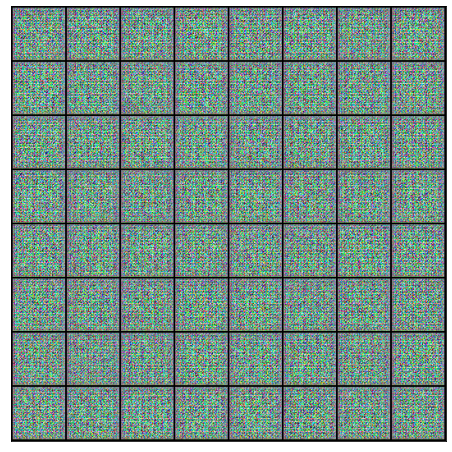

In [ ]:
%%time 
history = fit(epochs, lr)

fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)
fake_images = generator(fixed_latent)
fake_images = fake_image.detach().cpu()
show_images(fake_images)

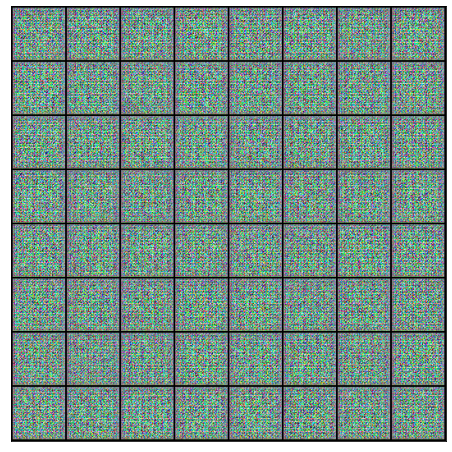

In [ ]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)
fake_images = generator(fixed_latent)
fake_images = fake_image.detach().cpu()
show_images(fake_images)

In [ ]:
torch.save(generator.state_dict(), 'pokemon_G.pth')
torch.save(discriminator.state_dict(), 'pokemon_D.pth')